# Sample overview

In [12]:
suppressPackageStartupMessages(library(SummarizedExperiment))
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(cowplot))
suppressPackageStartupMessages(library(RColorBrewer))
suppressPackageStartupMessages(library(DESeq2))
suppressPackageStartupMessages(library(ggrepel))
suppressPackageStartupMessages(library(reshape2))
library(patchwork)
library(umap)
library(Rtsne)

temp<-read.csv(file = "full_tissue_color.csv",header = F)
color_ft<-temp$V2
names(color_ft)<-temp$V1
color_ft




Spleen              Kidney       Adrenal Gland      Brain:Brain-Gr 
          "#BC80BD"           "#BEBADA"           "#8DD3C7"           "#FB8072" 
     Brain:Brain-Wh               Liver                Lung  Lymph node:LN-AX-R 
          "#a34136"           "#fff265"           "#80B1D3"           "#FDB462" 
Lymph node:LN-ING-L   Lymph node:LN-MES       Lymph node:NA                PBMC 
          "#ed830c"           "#f5b771"           "#ff8700"           "#B3DE69" 
    Sex Organ:Ovary Sex Organ:Sex-Organ    Sex Organ:Testis       Skin:Non-Rash 
          "#e64e9b"           "#FCCDE5"           "#a82d6c"           "#6e6969" 
          Skin:Rash          SpinalCord         Whole blood 
          "#D9D9D9"           "#f93d28"           "#CCEBC5"

In [13]:
source('../prj_helpers.R')

In [14]:
# load pre-qc'ed data
se.qc <- readRDS('../01-data/se.qc.rds')
se.qc@colData[,"tissue"][se.qc@colData[,"tissue"]=="Testis"]="Sex Organ"
se.qc@colData[,"tissue"][se.qc@colData[,"tissue"]=="Ovary"]="Sex Organ"
se.qc@colData[,"full.tissue"][se.qc@colData[,"full.tissue"]=="Testis"]="Sex Organ:Testis"
se.qc@colData[,"full.tissue"][se.qc@colData[,"full.tissue"]=="Ovary"]="Sex Organ:Ovary"
se.qc@colData[,"full.tissue"][se.qc@colData[,"full.tissue"]=="Skin"]="Skin:Non-Rash"
se.qc@colData[,"full.tissue"]<-droplevels(se.qc@colData[,"full.tissue"])


In [3]:
colnames(colData(se.qc))


[1] "file_identifiers"              "A.identifier"                 
 [3] "biosample"                     "batch.extraction"             
 [5] "irf.study.id"                  "id.cohort"                    
 [7] "id.individual"                 "tissue"                       
 [9] "data.received"                 "dn.rna"                       
[11] "date.broad.extract"            "quant.18s"                    
[13] "quant.18s.sd"                  "quant.kulesh"                 
[15] "quant.kulesh.sd"               "rin.e"                        
[17] "rna.conc.ng.uL"                "lib.conc.pmolar"              
[19] "xgen.index"                    "Assigned"                     
[21] "Unassigned_Unmapped"           "Unassigned_Read_Type"         
[23] "Unassigned_Singleton"          "Unassigned_MappingQuality"    
[25] "Unassigned_Chimera"            "Unassigned_FragmentLength"    
[27] "Unassigned_Duplicate"          "Unassigned_MultiMapping"      
[29] "Unassigned_Secondary"          "Unassigned_NonSplit"          
[31] "Unassigned_NoFeatures"         "Unassigned_Overlapping_Length"
[33] "Unassigned_Ambiguity"          "sub.tissue"                   
[35] "SampleType"                    "study.group"                  
[37] "challenge.group"               "animal.number"                
[39] "animal.tatoo"                  "sex"                          
[41] "weight"                        "birth.date"                   
[43] "viralReadCount"                "hostReadCount"                
[45] "pc.viral.reads"                "cohort.uncertain"             
[47] "cohort.numeric"                "totalReadCount"               
[49] "totalUnassigned"               "chrY_count"                   
[51] "chrX_count"                    "total_count"                  
[53] "Xist"                          "sex.1"                        
[55] "pc_Y"                          "pc_X"                         
[57] "Y_X_ratio"                     "sex_pred"                     
[59] "pred_recorded_sex_mismatch"    "dpi_time"                     
[61] "dpi_time_factor"               "xist_counts"                  
[63] "predicted_sex"                 "pred_rec_sex_mismatch"        
[65] "full.tissue"                   "sample_id_dedup"              
[67] "duplicate_sequencing"          "dpi_time_2"

In [4]:
unique(se.qc$SampleType)

[1] Experimental       Commercial-Control
Levels: Commercial-Control Experimental

In [15]:
#se.qc.experimental <- se.qc[,se.qc$SampleType == 'Experimental']
se.qc.experimental<-se.qc

In [16]:
se.qc.experimental <- DESeqDataSet(se.qc.experimental, design=~1)

In [17]:
se.qc.experimental <- DESeq(se.qc.experimental)

Warning message in DESeq(se.qc.experimental):
“the design is ~ 1 (just an intercept). is this intended?”
estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 4974 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



# Tissue overview

In [18]:
write.csv(colData(se.qc.experimental.nonblood),"QC_metadata.csv")

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'colData': object 'se.qc.experimental.nonblood' not found


In [ ]:
# select tissue samples
#se.qc.experimental.nonblood <- se.qc.experimental[,!se.qc.experimental$tissue %in% c("Whole blood","PBMC")]
se.qc.experimental.nonblood<-se.qc.experimental

In [54]:
vsd.qc <- vst(se.qc.experimental.nonblood)
ntop = 4000
rv <- rowVars(assay(vsd.qc))
select <- order(rv, decreasing = TRUE)[seq_len(min(ntop,length(rv)))]
set.seed(2018)
tsne <- Rtsne(t(assay(vsd.qc)[select,]))
tmp <- tsne$Y
colnames(tmp) <- c('X','Y')
d <- data.frame(tmp, colData(se.qc.experimental.nonblood))
d["tissue"][d["tissue"]=="Testis"]="Sex Organ"
d["tissue"][d["tissue"]=="Ovary"]="Sex Organ"
d["full.tissue2"]=d["full.tissue"]
d["full.tissue2"][d["full.tissue2"]=="Testis"]="Sex Organ:Testis"
d["full.tissue2"][d["full.tissue2"]=="Ovary"]="Sex Organ:Ovary"
d["full.tissue2"][d["full.tissue2"]=="Skin"]="Skin:Non-Rash"




In [19]:
tissue.pal <- readRDS('../04-qc_plots/tissue.pal.rds')
tissue.pal["SpinalCord"]="#f93d28"
tissue.pal["Liver"]="#fff265"
tissue.pal["Brain"]="#FB8072"

tissue.pal

Adrenal Gland         Brain        Kidney         Liver          Lung 
    "#8DD3C7"     "#FB8072"     "#BEBADA"     "#fff265"     "#80B1D3" 
   Lymph node          PBMC     Sex Organ          Skin        Spleen 
    "#FDB462"     "#B3DE69"     "#FCCDE5"     "#D9D9D9"     "#BC80BD" 
  Whole blood    SpinalCord 
    "#CCEBC5"     "#f93d28"

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


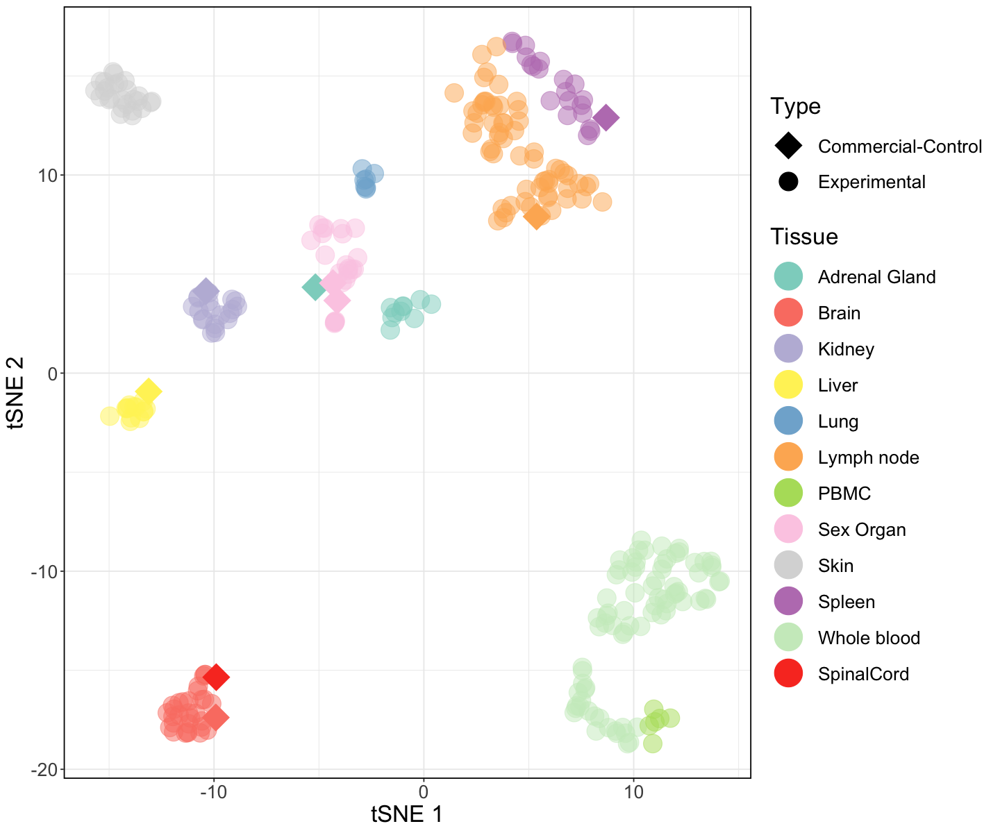

In [55]:
options(repr.plot.width = 12, repr.plot.height = 10)

ggplot(d) + 
    geom_point(size=11, 
               aes(x=X,y=Y,shape=SampleType,col=tissue,alpha=SampleType))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.5),guide=FALSE)+
scale_color_manual(name="Tissue",values =tissue.pal )+
    scale_x_continuous(name='tSNE 1') +
    scale_y_continuous(name='tSNE 2') +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))

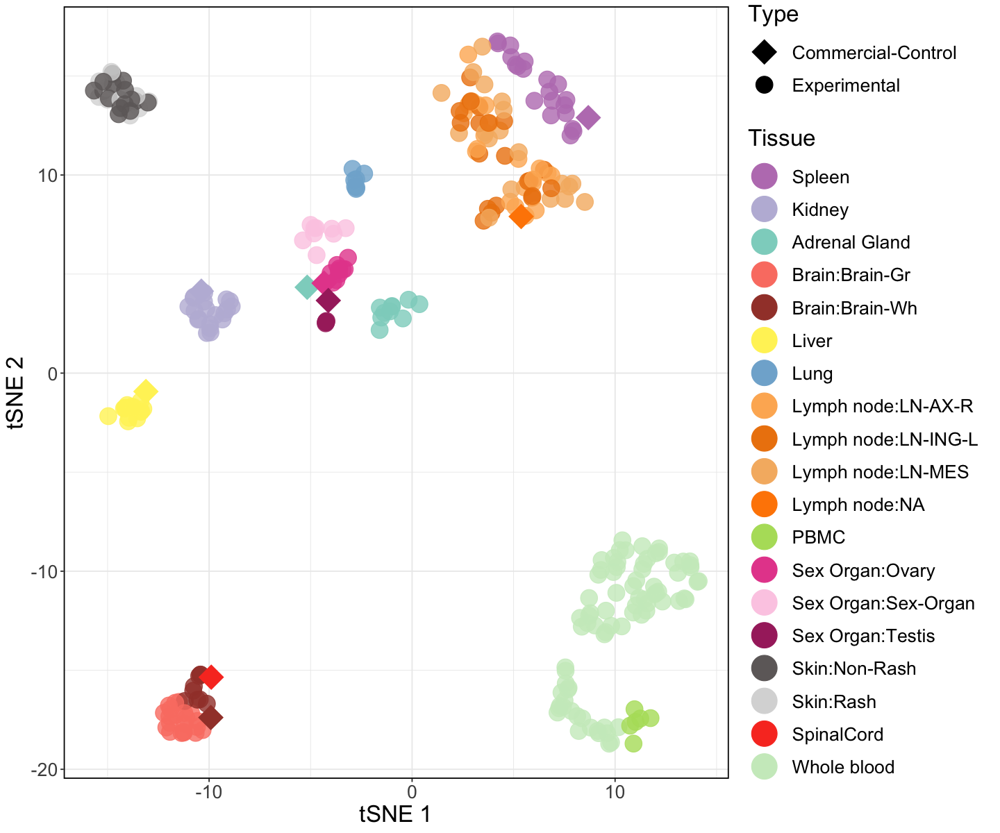

In [57]:
options(repr.plot.width = 12, repr.plot.height = 10)
#d2<-d %>% arrange(desc(SampleType))
ggplot(d %>% arrange(desc(SampleType))) + 
    geom_point(size=10, 
               aes(x=X,y=Y,shape=SampleType,col=full.tissue2,alpha=SampleType))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
scale_color_manual(name="Tissue",values =color_ft )+
    scale_x_continuous(name='tSNE 1') +
    scale_y_continuous(name='tSNE 2') +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))

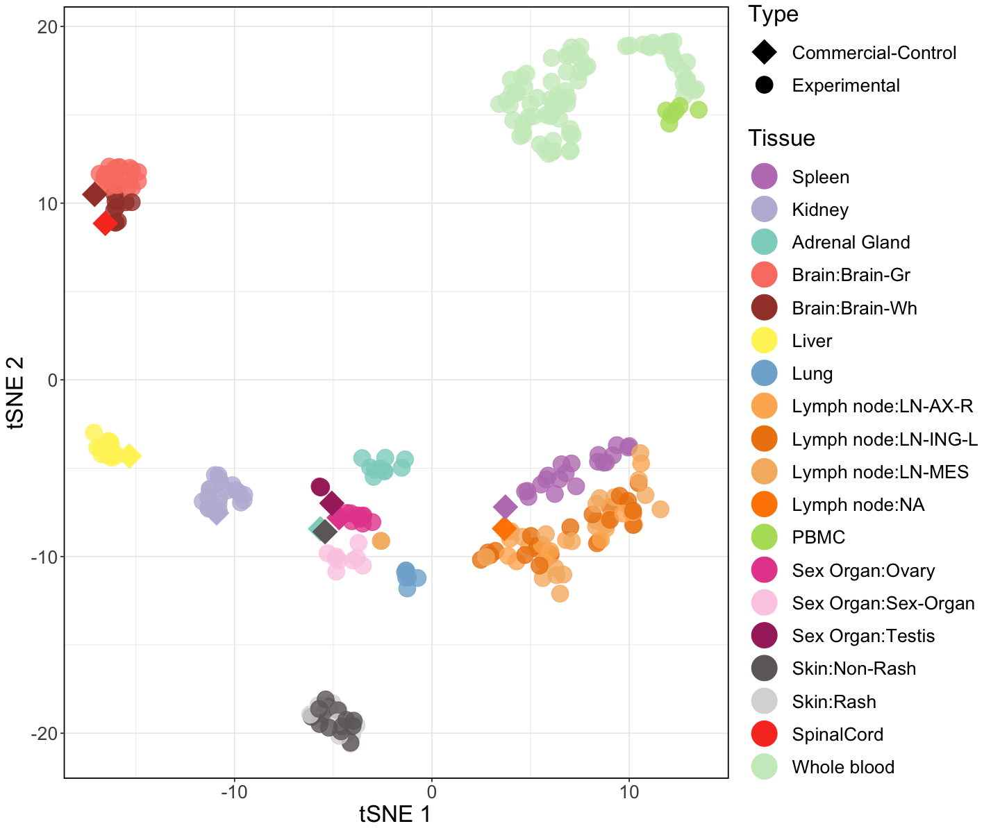

In [37]:
options(repr.plot.width = 12, repr.plot.height = 10)
#d2<-d %>% arrange(desc(SampleType))
ggplot(d %>% arrange(desc(SampleType))) + 
    geom_point(size=10, 
               aes(x=X,y=Y,shape=SampleType,col=full.tissue2,alpha=SampleType))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
scale_color_manual(name="Tissue",values =color_ft )+
    scale_x_continuous(name='tSNE 1') +
    scale_y_continuous(name='tSNE 2') +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))

In [23]:
saveRDS(se.qc.experimental.nonblood,"se.qc.experimental.nonblood.rds")

In [21]:
se.qc.experimental.nonblood<-readRDS("se.qc.experimental.nonblood.rds")
unique(se.qc.experimental.nonblood$biosample)

[1] "RA1803_Spleen"            "RA1803_Kidney"           
  [3] "RA1803_Liver-L"           "RA1803_Brain-Gr"         
  [5] "RA1803_Ovary"             "RA1803_LN-AX-R"          
  [7] "RA1803_LN-ING-L"          "RA1082_LN-MES"           
  [9] "RA1803_Sex-Organ"         "RA1803_Skin-Rash"        
 [11] "RA1803_Skin-Non-Rash"     "RA0850_Spleen"           
 [13] "RA0850_Kidney"            "RA0850_Adrenal"          
 [15] "RA0850_Brain-Gr"          "RA0850_Ovary"            
 [17] "RA0850_LN-AX-R"           "RA0850_LN-ING-L"         
 [19] "RA0850_LN-MES"            "RA0850_LNG-CD-R"         
 [21] "RA0850_Sex-Organ"         "RA0717_Spleen"           
 [23] "RA0717_Kidney"            "RA0717_Brain-Gr"         
 [25] "RA0717_LN-AX-R"           "RA0717_LN-ING-L"         
 [27] "RA0717_LN-MES"            "RA0717_Sex-Organ"        
 [29] "RA0700_Spleen"            "RA0700_Kidney"           
 [31] "RA0700_Adrenal"           "RA0700_Brain-Gr"         
 [33] "RA0700_Ovary"             "RA0700_LN-AX-R"          
 [35] "RA0700_LN-ING-L"          "RA0700_LN-MES"           
 [37] "RA0700_Skin-Rash"         "RA0700_Skin-Non-Rash"    
 [39] "RA0223_Spleen"            "RA0223_Kidney"           
 [41] "RA0223_Brain-Gr"          "RA0223_Ovary"            
 [43] "RA0223_LN-AX-R"           "RA0223_LN-ING-L"         
 [45] "RA0223_LN-MES"            "RA0223_Skin-Rash"        
 [47] "RA0223_Skin-Non-Rash"     "RA1779_Spleen"           
 [49] "RA1779_Kidney"            "RA1779_Adrenal"          
 [51] "RA1779_Brain-Gr"          "RA1779_Ovary"            
 [53] "RA1779_LN-AX-R"           "RA1779_LN-ING-L"         
 [55] "RA1779_LN-MES"            "RA1779_Skin-Rash"        
 [57] "RA1779_Skin-Non-Rash"     "RA1834_Spleen"           
 [59] "RA1834_Kidney"            "RA1834_Adrenal"          
 [61] "RA1834_Brain-Gr"          "RA1834_Testis"           
 [63] "RA1834_LN-AX-R"           "RA1834_LN-ING-L"         
 [65] "RA1834_LN-MES"            "RA1834_LNG-CD-R"         
 [67] "RA1834_Sex-Organ"         "RA1834_Skin-Rash"        
 [69] "RA1834_Skin-Non-Rash"     "RA0449_Spleen"           
 [71] "RA0449_Kidney"            "RA0449_Liver-L"          
 [73] "RA0449_Brain-Wh"          "RA0449_Brain-Gr"         
 [75] "RA0449_Ovary"             "RA0449_LN-AX-R"          
 [77] "RA0449_LN-ING-L"          "RA0449_LN-MES"           
 [79] "RA0449_Skin-Rash"         "RA0449_Skin-Non-Rash"    
 [81] "RA0552_Spleen"            "RA0552_Kidney"           
 [83] "RA0552_Liver-L"           "RA0552_Brain-Wh"         
 [85] "RA0552_Brain-Gr"          "RA0552_Ovary"            
 [87] "RA0552_LN-AX-R"           "RA0552_LN-ING-L"         
 [89] "RA0552_LN-MES"            "RA0552_LNG-CD-R"         
 [91] "RA0552_Skin-Rash"         "RA0552_Skin-Non-Rash"    
 [93] "RA0452_Spleen"            "RA0452_Kidney"           
 [95] "RA0452_Liver-L"           "RA0452_Brain-Wh"         
 [97] "RA0452_Brain-Gr"          "RA0452_Ovary"            
 [99] "RA0452_LN-AX-R"           "RA0452_LN-ING-L"         
[101] "RA0452_LN-MES"            "RA0452_LNG-CD-R"         
[103] "RA0452_Skin-Rash"         "RA0452_Skin-Non-Rash"    
[105] "RA1790_Spleen"            "RA1790_Kidney"           
[107] "RA1790_Adrenal"           "RA1790_Brain-Wh"         
[109] "RA1790_Brain-Gr"          "RA1790_Ovary"            
[111] "RA1790_LN-AX-R"           "RA1790_LN-ING-L"         
[113] "RA1790_LN-MES"            "RA1790_Skin-Rash"        
[115] "RA1790_Skin-Non-Rash"     "RA1818_Kidney"           
[117] "RA1818_Liver-L"           "RA1818_Brain-Gr"         
[119] "RA1818_Ovary"             "RA1818_LN-AX-R"          
[121] "RA1818_LN-ING-L"          "RA1818_LN-MES"           
[123] "RA1818_Sex-Organ"         "RA1849_Spleen"           
[125] "RA1849_Liver-L"           "RA1849_Adrenal"          
[127] "RA1849_Brain-Wh"          "RA1849_Brain-Gr"         
[129] "RA1849_Ovary"             "RA1849_LN-AX-R"          
[131] "RA1849_LN-ING-L"          "RA1849_LN-MES"           
[133] "RA1849_LNG-CD-R"          "RA1849_S

In [23]:
##QC Based on TSNE
se.qc.experimental.nonblood <- se.qc.experimental.nonblood[,!se.qc.experimental.nonblood$biosample %in% c('RA0223_LN-MES','RA0717_LN-MES')]
se.qc.experimental.nonblood <- se.qc.experimental.nonblood[,!se.qc.experimental.nonblood$file_identifiers %in% c('Zyagen_D000_Skin.190507_long_S2')]
#saveRDS(se.qc.experimental.nonblood,'../03-sample_qc/se.qc.experimental.rds')                                                        

In [24]:
vsd.qc <- vst(se.qc.experimental.nonblood)
ntop = 4000
rv <- rowVars(assay(vsd.qc))
select <- order(rv, decreasing = TRUE)[seq_len(min(ntop,length(rv)))]
set.seed(20191)
tsne <- Rtsne(t(assay(vsd.qc)[select,]))
tmp <- tsne$Y
colnames(tmp) <- c('X','Y')
d2 <- data.frame(tmp, colData(se.qc.experimental.nonblood))
d2["tissue"][d2["tissue"]=="Testis"]="Sex Organ"
d2["tissue"][d2["tissue"]=="Ovary"]="Sex Organ"
d2["full.tissue2"]=d2["full.tissue"]
d2["full.tissue2"][d2["full.tissue2"]=="Testis"]="Sex Organ:Testis"
d2["full.tissue2"][d2["full.tissue2"]=="Ovary"]="Sex Organ:Ovary"
d2["full.tissue2"][d2["full.tissue2"]=="Skin"]="Skin:Non-Rash"


umap = umap(t(assay(vsd.qc)[select,]),)

pca <- prcomp(t(assay(vsd.qc)[select,]))
percentVar <- pca$sdev ^ 2 / sum(pca$sdev ^ 2)
d2 <-data.frame(x.umap=umap$layout[,1],y.umap=umap$layout[,2],
        PC1 = pca$x[, 1],
        PC2 = pca$x[, 2],
        PC3 = pca$x[, 3],
        PC4 = pca$x[, 4],
        PC5 = pca$x[, 5],
        PC6 = pca$x[, 6],
        PC7 = pca$x[, 7],
        PC8 = pca$x[, 8],
        PC9 = pca$x[, 9],
        PC10 = pca$x[, 10],
        d2,
        name = colnames(vsd.qc)
      )

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”


Warning message in geom_point(size = 8, aes(x = X, y = Y, shape = SampleType, col = full.tissue2, :
“Ignoring unknown aesthetics: label”
Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”
Warning message in geom_point(size = 3, aes(x = x.umap, y = y.umap, shape = SampleType, :
“Ignoring unknown aesthetics: label”
Warning message in geom_point(size = 3, aes(x = PC1, y = PC2, shape = SampleType, :
“Ignoring unknown aesthetics: label”
Warning message in geom_point(size = 5, aes(x = PC1, y = PC2, shape = SampleType, :
“Ignoring unknown aesthetics: label”
Warning message in brewer.pal(n = 100, name = "Blues"):
“n too large, allowed maximum for palette Blues is 9
Returning the palette you asked for with that many colors
”


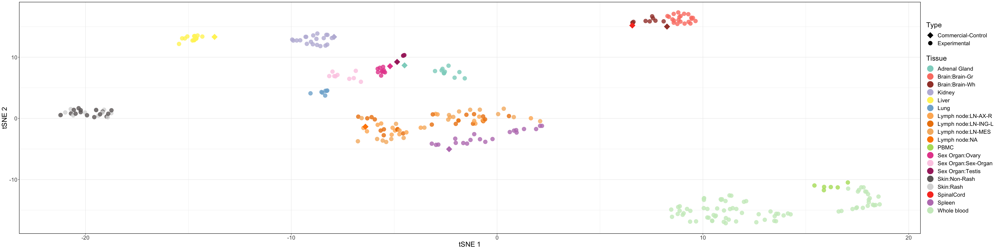

Warning message in geom_point(size = 8, aes(x = X, y = Y, shape = SampleType, col = as.numeric(dpi_time_2), :
“Ignoring unknown aesthetics: label”
Warning message in brewer.pal(n = 100, name = "Blues"):
“n too large, allowed maximum for palette Blues is 9
Returning the palette you asked for with that many colors
”


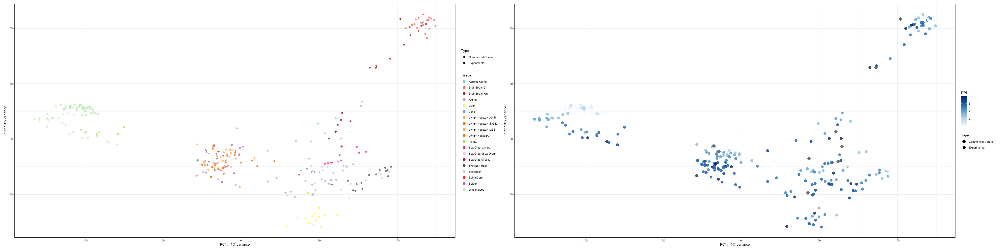

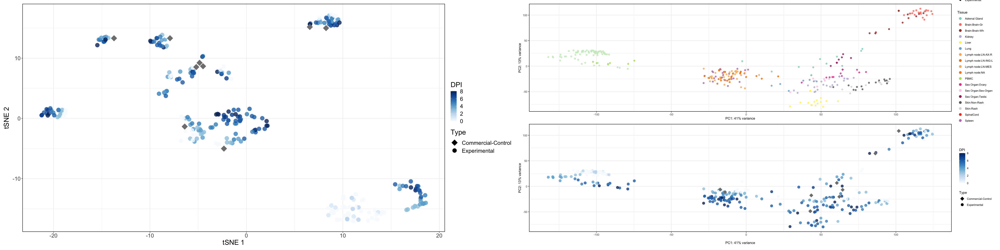

In [25]:
options(repr.plot.width = 40, repr.plot.height = 10)
#d2<-d %>% arrange(desc(SampleType))
p<-ggplot(d2 %>% arrange(desc(SampleType))) + 
    geom_point(size=8, 
               aes(x=X,y=Y,shape=SampleType,col=full.tissue2,alpha=SampleType,label=biosample))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
scale_color_manual(name="Tissue",values =color_ft )+
    scale_x_continuous(name='tSNE 1') +
    scale_y_continuous(name='tSNE 2') +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))
p
ggsave("TSNE.pdf",width=12,height=10)


p2<-ggplot(d2 %>% arrange(desc(SampleType))) + 
    geom_point(size=3, 
               aes(x=x.umap,y=y.umap,shape=SampleType,col=full.tissue2,alpha=SampleType,label=biosample))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
scale_color_manual(name="Tissue",values =color_ft )+
    scale_x_continuous(name='uMAP 1') +
    scale_y_continuous(name='uMAP 2') +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))


p3<-ggplot(d2 %>% arrange(desc(SampleType))) + 
    geom_point(size=3, 
               aes(x=PC1,y=PC2,shape=SampleType,col=full.tissue2,alpha=SampleType,label=biosample))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
scale_color_manual(name="Tissue",values =color_ft )+
    ggplot2::xlab(paste0("PC1: ", round(percentVar[1] * 100), "% variance")) + 
      ggplot2::ylab(paste0("PC2: ", round(percentVar[2] * 100), "% variance")) +theme_bw()+
    theme(text=element_text(size=10,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))

p3_DPI<-ggplot(d2 %>% arrange(desc(SampleType))) + 
    geom_point(size=5, 
               aes(x=PC1,y=PC2,shape=SampleType,col=as.numeric(dpi_time_2),alpha=SampleType,label=biosample))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
  scale_colour_gradientn(colours = brewer.pal(n = 100, name = "Blues"),name="DPI")+
    ggplot2::xlab(paste0("PC1: ", round(percentVar[1] * 100), "% variance")) + 
      ggplot2::ylab(paste0("PC2: ", round(percentVar[2] * 100), "% variance")) +theme_bw()+
    theme(text=element_text(size=10,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))
p3+p3_DPI
ggsave("DPI_PCA.pdf",width=14,height=5)


p<-ggplot(d2 %>% arrange(desc(SampleType))) + 
    geom_point(size=8, 
               aes(x=X,y=Y,shape=SampleType,col=as.numeric(dpi_time_2),alpha=SampleType,label=biosample))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
scale_colour_gradientn(colours = brewer.pal(n = 100, name = "Blues"),name="DPI")+
    scale_x_continuous(name='tSNE 1') +
    scale_y_continuous(name='tSNE 2') +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))
p+(p3/p3_DPI)

ggsave("DPI_Tsne.pdf",width=20,height=10)


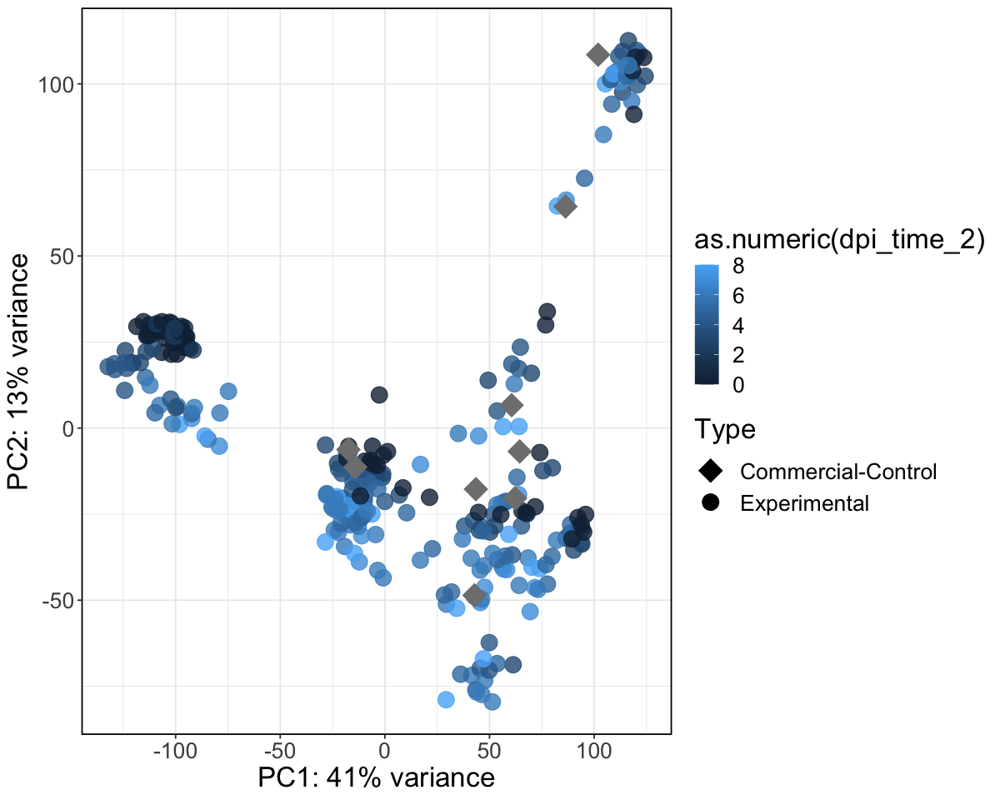

In [58]:
ggplot(d2 %>% arrange(desc(SampleType))) + 
    geom_point(size=8, 
               aes(x=PC1,y=PC2,shape=SampleType,col=as.numeric(dpi_time_2),alpha=SampleType,label=biosample))+
scale_shape_manual(name="Type",values = c(18,20))+scale_alpha_manual(values=c(1,0.8),guide="none")+
    ggplot2::xlab(paste0("PC1: ", round(percentVar[1] * 100), "% variance")) +
      ggplot2::ylab(paste0("PC2: ", round(percentVar[2] * 100), "% variance")) +theme_bw()+
    theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))


In [59]:
se.qc.experimental <- se.qc.experimental.nonblood[,se.qc.experimental.nonblood$SampleType == 'Experimental']
se.qc.experimental<-se.qc.experimental[,!as.numeric(se.qc.experimental$dpi_time)<0]
rownames(se.qc.experimental)[rowData(se.qc.experimental)$viralGene]
viralGenes<-rownames(se.qc.experimental)[rowData(se.qc.experimental)$viralGene]
head(viralGenes)
se.qc.experimental$ID<-1:262
se.qc.experimental$ID
test<-t(as.data.frame((se.qc.experimental@colData[,c("quant.kulesh","dpi_time_factor",
                                                     "full.tissue","viralReadCount","id.individual")])))
test

[1] "EBOV-5pLeader"  "EBOV-NP"        "EBOV-VP35"      "EBOV-VP40"     
 [5] "EBOV-GP"        "EBOV-VP30"      "EBOV-MidReg"    "EBOV-VP24"     
 [9] "EBOV-L"         "EBOV-3pTrailer"

[1] "EBOV-5pLeader" "EBOV-NP"       "EBOV-VP35"     "EBOV-VP40"    
[5] "EBOV-GP"       "EBOV-VP30"

[1]   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
 [19]  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
 [37]  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
 [55]  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
 [73]  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
 [91]  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
[109] 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
[127] 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
[145] 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
[163] 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
[181] 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
[199] 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
[217] 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
[235] 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252
[253] 253 254 255 256 257 258 259 260 261 262

,A0001_S121_L002,A0002_S124_L002,A0003,A0006_S89_L002,A0007_S17_L001,A0008_S140_L002,A0009_S139_L002,A0010_S19_L001,A0012_S16_L001,A0013_S47_L001,⋯,A0375_S50_L001,RA0449.D003_S105_L002,RA0452_PBMC_D005_S10,RA0717.Liver_S10,RA0717_PBMC_D004_S9,RA0850.Liver_S11,RA1074_PBMC_D006_S11,RA1325_PBMC_D006_S12,RA1779.Liver_S7,RA1803_PBMC_D006_S13
quant.kulesh,8.37e+04,1.61e+02,4.74e+03,4.60e+01,1.34e+02,1.10e+04,1.86e+04,NA,2.06e+02,2.33e+01,⋯,4.36e+04,4.77e-01,4.52e+00,2.62e+03,7.65e-01,9.40e+01,3.54e+00,4.01e+00,1.27e+03,6.55e+00
dpi_time_factor,6,6,6,6,6,6,6,6,6,6,⋯,6,3,5,4,4,4,6,6,8,6
full.tissue,Spleen,Kidney,Liver,Brain:Brain-Gr,Sex Organ:Ovary,Lymph node:LN-AX-R,Lymph node:LN-ING-L,Lymph node:LN-MES,Sex Organ:Sex-Organ,Skin:Rash,⋯,Whole blood,PBMC,PBMC,Liver,PBMC,Liver,PBMC,PBMC,Liver,PBMC
viralReadCount,93139,4341,19278,32,2413,12850,18737,18649,18184,39,⋯,260449,8,1472,61202,110,1826,2626,553,22743,975
id.individual,RA1803,RA1803,RA1803,RA1803,RA1803,RA1803,RA1803,RA1803,RA1803,RA1803,⋯,RA1803,RA0449,RA0452,RA0717,RA0717,RA0850,RA1074,RA1325,RA1779,RA1803


In [60]:
norm_counts <- counts(se.qc.experimental, normalized=TRUE)
log_norm_counts <- log10(norm_counts[viralGenes,]+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
logVirCounts$quant.kulesh<-log10(as.numeric(logVirCounts$quant.kulesh)+1)
logVirCounts$viralReadCount<-log10(as.numeric(logVirCounts$viralReadCount)+1)
logVirCounts[colnames(logVirCounts[c(-3,-5)])] <- sapply(logVirCounts[colnames(logVirCounts[c(-3,-5)])],as.numeric)
logVirCounts<-logVirCounts[c(-6,-12)]
colnames(logVirCounts)[1]<-"log10(qPCR+1)"
logVirCounts

[1]  10 262

,log10(qPCR+1),dpi_time_factor,full.tissue,viralReadCount,id.individual,EBOV-NP,EBOV-VP35,EBOV-VP40,EBOV-GP,EBOV-VP30,EBOV-VP24,EBOV-L,EBOV-3pTrailer
,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A0001_S121_L002,4.92273065,6,Spleen,4.9691362,RA1803,3.6512431,3.2386357,3.4927634,3.8213063,3.1750954,3.4124030,3.9814803,2.5922625
A0002_S124_L002,2.20951501,6,Kidney,3.6376898,RA1803,3.2168898,2.7108958,2.9632482,3.1980720,2.5010727,2.6411735,3.1466260,1.9220786
A0003,3.67586996,6,Liver,4.2850845,RA1803,3.6054976,3.1413880,3.4212636,3.9291533,2.7381063,2.9783892,3.5307187,1.9717409
A0006_S89_L002,1.67209786,6,Brain:Brain-Gr,1.5185139,RA1803,0.7504060,0.3338840,0.5902755,0.7928997,0.3338840,0.1982677,0.5902755,0.0000000
A0007_S17_L001,2.13033377,6,Sex Organ:Ovary,3.3827373,RA1803,2.4226534,2.0942188,2.1667597,2.3245406,1.8341650,1.9652780,2.4400264,0.9928650
A0008_S140_L002,4.04143216,6,Lymph node:LN-AX-R,4.1089369,RA1803,2.8437326,2.3380989,2.6091312,2.9932782,2.3124000,2.5445840,3.1661270,1.4040510
A0009_S139_L002,4.26953629,6,Lymph node:LN-ING-L,4.2727232,RA1803,2.9628113,2.4544923,2.6771400,3.1005605,2.4372380,2.6645777,3.3151196,1.5967474
A0010_S19_L001,NA,6,Lymph node:LN-MES,4.2706788,RA1803,3.0890152,2.7272842,2.8857243,3.2306418,2.3460805,2.5144424,3.1606701,1.6049989
A0012_S16_L001,2.31597035,6,Sex Organ:Sex-Organ,4.2597133,RA1803,3.9627190,3.6490593,3.7611872,4.0602695,3.4848359,3.7173997,4.3912608,3.2584285


## Correlation of Viral Genes

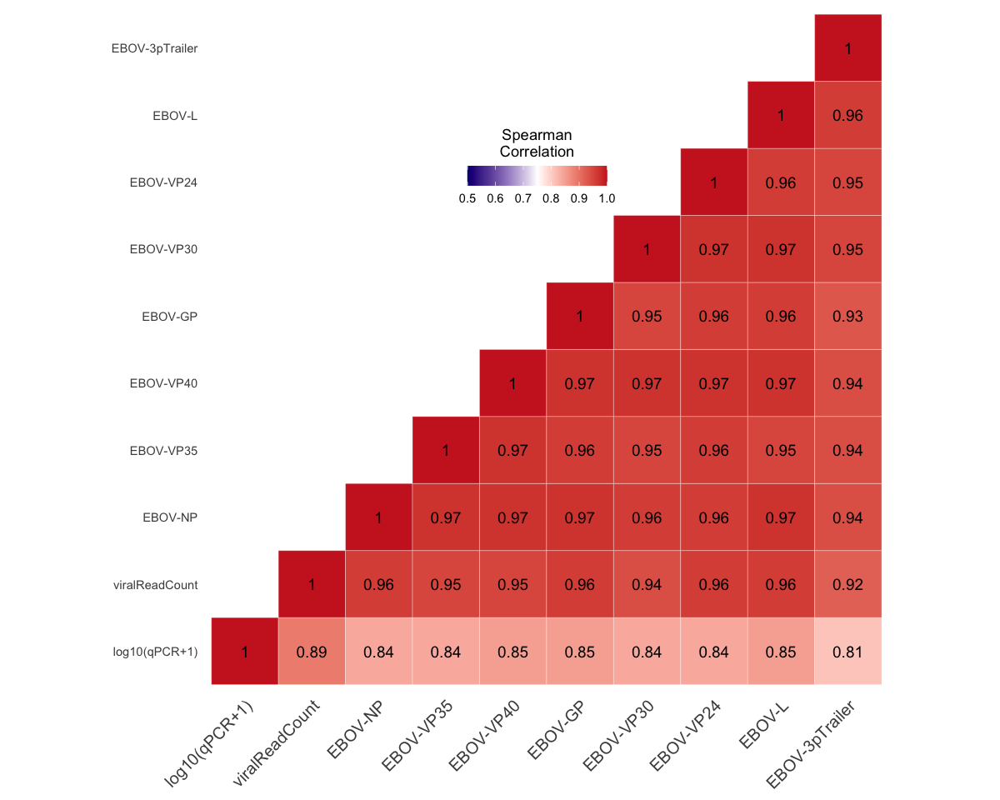

In [61]:
options(repr.plot.width = 10, repr.plot.height = 8)
cormat <- round(cor(na.omit(logVirCounts[c(-2,-3,-5)]),method = "spearman"),2)
# Get lower triangle of the correlation matrix
  get_upper_tri <- function(cormat){
    cormat[lower.tri(cormat)]<- NA
    return(cormat)
  }
reorder_cormat <- function(cormat){
# Use correlation between variables as distance
dd <- as.dist((1-cormat)/2)
hc <- hclust(dd)
cormat <-cormat[hc$order, hc$order]
}
# Reorder the correlation matrix
#cormat <- reorder_cormat(cormat)
upper_tri <- get_upper_tri(cormat)
# Melt the correlation matrix
melted_cormat <- melt(upper_tri, na.rm = TRUE)
# Create a ggheatmap
ggheatmap <- ggplot(melted_cormat, aes(Var2, Var1, fill = value))+
 geom_tile(color = "white")+
 scale_fill_gradient2(low = "navy", high = "firebrick3", mid = "white", 
   midpoint = 0.75, limit = c(0.5,1), space = "Lab", 
    name="Spearman\nCorrelation") +
  theme_minimal()+ # minimal theme
 theme(axis.text.x = element_text(angle = 45, vjust = 1, 
    size = 12, hjust = 1))+
 coord_fixed()
P<-ggheatmap + 
geom_text(aes(Var2, Var1, label = value), color = "black", size = 4) +
theme(
  axis.title.x = element_blank(),
  axis.title.y = element_blank(),
  panel.grid.major = element_blank(),
  panel.border = element_blank(),
  panel.background = element_blank(),
  axis.ticks = element_blank(),
  legend.justification = c(1, 0),
  legend.position = c(0.6, 0.7),
  legend.direction = "horizontal")+
  guides(fill = guide_colorbar(barwidth = 7, barheight = 1,
                title.position = "top", title.hjust = 0.5))
P


,sample,dpi_time_factor,full.tissue,id.individual,variable,value
,<chr>,<dbl>,<chr>,<chr>,<fct>,<dbl>
1,A0001_S121_L002,6,Spleen,RA1803,log10(qPCR+1),4.922731
2,A0002_S124_L002,6,Kidney,RA1803,log10(qPCR+1),2.209515
3,A0003,6,Liver,RA1803,log10(qPCR+1),3.675870
4,A0006_S89_L002,6,Brain:Brain-Gr,RA1803,log10(qPCR+1),1.672098
5,A0007_S17_L001,6,Sex Organ:Ovary,RA1803,log10(qPCR+1),2.130334
6,A0008_S140_L002,6,Lymph node:LN-AX-R,RA1803,log10(qPCR+1),4.041432


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


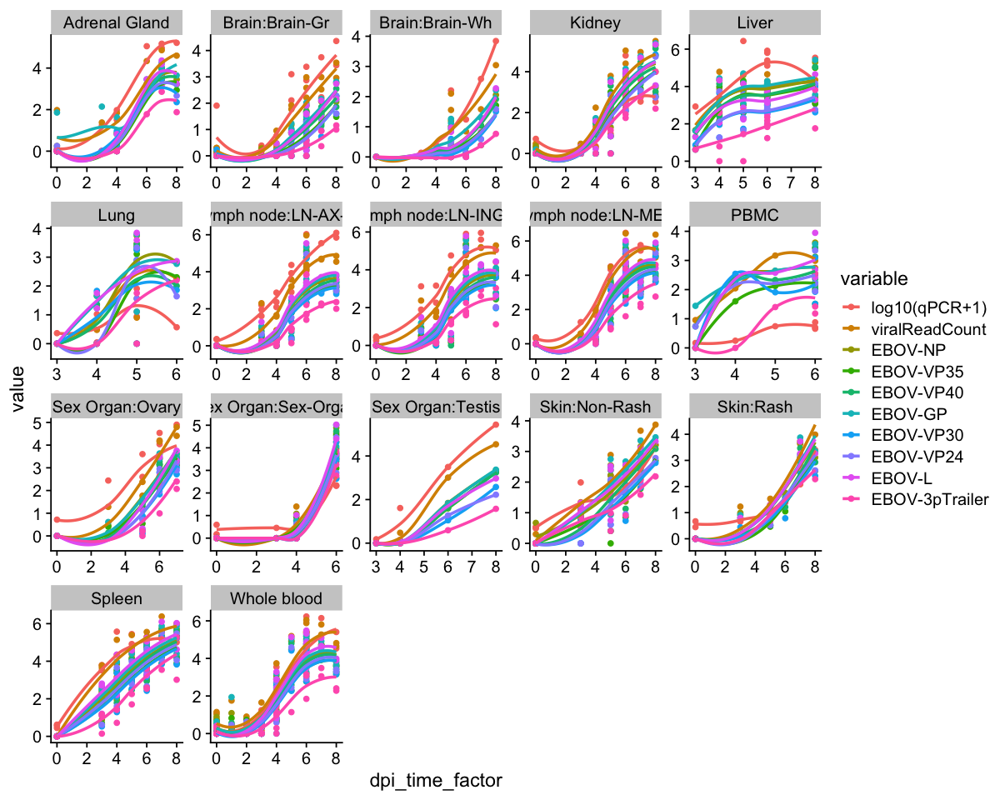

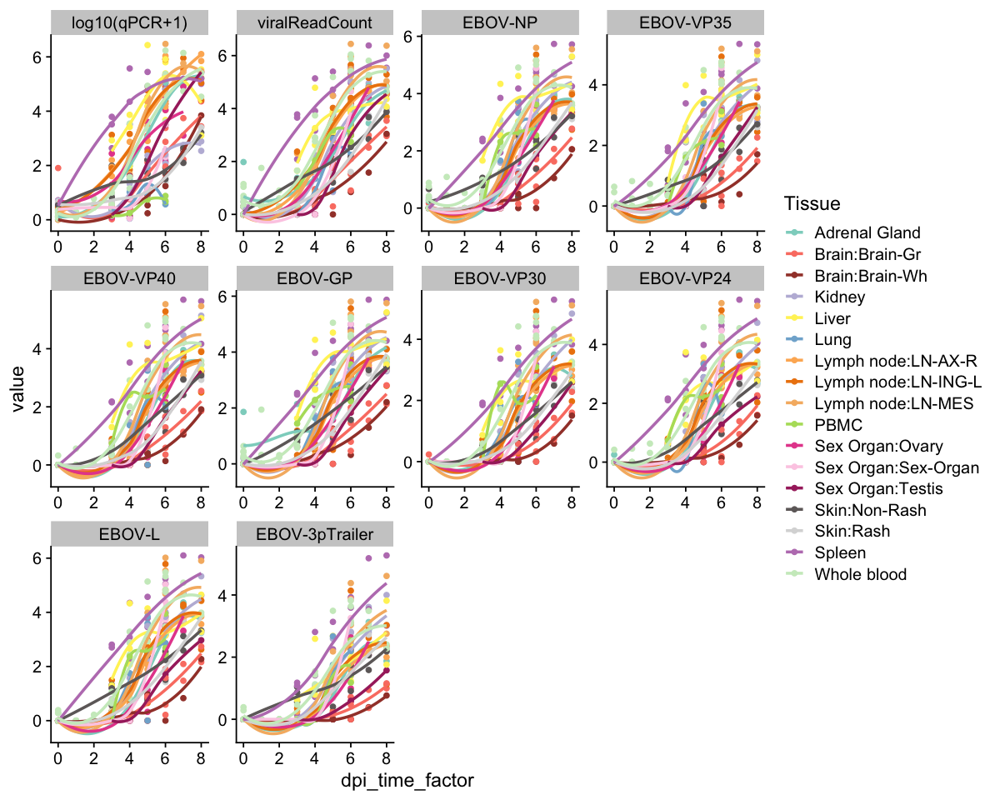

In [53]:
logVirCounts$sample<-rownames(logVirCounts)
melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue","id.individual"))
head(melt.logVirCounts)
options(warn=-1)
#latrendData
ggplot(melt.logVirCounts,aes(x = dpi_time_factor,y=value,col=variable))+theme_cowplot()+
geom_point()+geom_smooth(se = FALSE,span=1)+ facet_wrap(~ full.tissue,scales = "free")

ggplot(melt.logVirCounts,aes(x = dpi_time_factor,y=value,col=full.tissue))+theme_cowplot()+
geom_point()+geom_smooth(se = FALSE,span=1)+ facet_wrap(~ variable,scales = "free")+
scale_color_manual(name="Tissue",values =color_ft )

In [62]:
head(melt.logVirCounts)

,sample,dpi_time_factor,full.tissue,id.individual,variable,value
,<chr>,<dbl>,<chr>,<chr>,<fct>,<dbl>
1,A0001_S121_L002,6,Spleen,RA1803,log10(qPCR+1),4.922731
2,A0002_S124_L002,6,Kidney,RA1803,log10(qPCR+1),2.209515
3,A0003,6,Liver,RA1803,log10(qPCR+1),3.675870
4,A0006_S89_L002,6,Brain:Brain-Gr,RA1803,log10(qPCR+1),1.672098
5,A0007_S17_L001,6,Sex Organ:Sex-Organ,RA1803,log10(qPCR+1),2.130334
6,A0008_S140_L002,6,Lymph node:LN-AX-R,RA1803,log10(qPCR+1),4.041432


In [63]:
options(warn=-1)
library(dplyr)
melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"
head(melt.logVirCounts)
mean.log.virus<-melt.logVirCounts %>%
  group_by(full.tissue, dpi_time_factor,variable) %>%
  summarise(mean=(mean(as.numeric(value),na.rm = TRUE)))
head(mean.log.virus)
#mean.log.virus %>% filter(full.tissue == "Lung")
P2<-ggplot(mean.log.virus,aes(x = dpi_time_factor,y=mean,col=full.tissue))+theme_cowplot()+
geom_point()+geom_line()+ 
facet_wrap(~ variable,scales = "free",ncol = 3)+
scale_color_manual(name="Tissue",values =color_ft[unique(mean.log.virus$full.tissue)] )+
xlab("DPI")+ylab("Mean expression")

ggsave(plot = P2,filename = "Plot_Viral.pdf",width=14,height=9)

,sample,dpi_time_factor,full.tissue,id.individual,variable,value
,<chr>,<dbl>,<chr>,<chr>,<fct>,<dbl>
1,A0001_S121_L002,6,Spleen,RA1803,log10(qPCR+1),4.922731
2,A0002_S124_L002,6,Kidney,RA1803,log10(qPCR+1),2.209515
3,A0003,6,Liver,RA1803,log10(qPCR+1),3.675870
4,A0006_S89_L002,6,Brain:Brain-Gr,RA1803,log10(qPCR+1),1.672098
5,A0007_S17_L001,6,Sex Organ:Sex-Organ,RA1803,log10(qPCR+1),2.130334
6,A0008_S140_L002,6,Lymph node:LN-AX-R,RA1803,log10(qPCR+1),4.041432


`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor'. You can
override using the `.groups` argument.


full.tissue,dpi_time_factor,variable,mean
<chr>,<dbl>,<fct>,<dbl>
Adrenal Gland,0,log10(qPCR+1),0.10882881
Adrenal Gland,0,viralReadCount,0.65924120
Adrenal Gland,0,EBOV-NP,0.08304084
Adrenal Gland,0,EBOV-VP35,0.00000000
Adrenal Gland,0,EBOV-VP40,0.00000000
Adrenal Gland,0,EBOV-GP,0.61965566


In [71]:
head(dataCluster)

full.tissue,dpi_time_factor,variable,mean,Tissue_Gene
<chr>,<dbl>,<fct>,<dbl>,<chr>
Adrenal Gland,0,viralReadCount,0.6592412,Adrenal Gland_viralReadCount
Adrenal Gland,3,viralReadCount,1.3802112,Adrenal Gland_viralReadCount
Adrenal Gland,4,viralReadCount,1.0699395,Adrenal Gland_viralReadCount
Adrenal Gland,6,viralReadCount,4.3383569,Adrenal Gland_viralReadCount
Adrenal Gland,7,viralReadCount,4.1549872,Adrenal Gland_viralReadCount
Adrenal Gland,8,viralReadCount,4.5964541,Adrenal Gland_viralReadCount


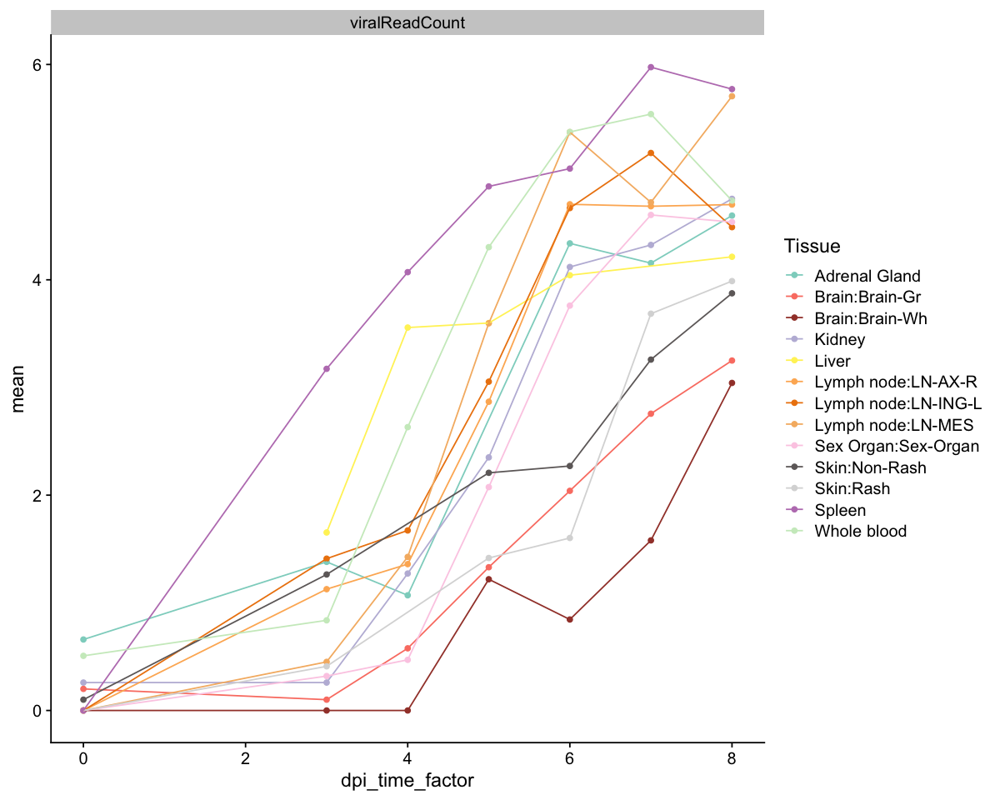

In [64]:
dataCluster<-mean.log.virus %>% filter(!full.tissue %in% c("Lung","PBMC"))%>%
filter(!dpi_time_factor %in% c(1,2))%>%filter(variable %in% c("quant.kulesh","viralReadCount"))
dataCluster$Tissue_Gene<-paste0(dataCluster$full.tissue,"_",dataCluster$variable)
ggplot(dataCluster,aes(x = dpi_time_factor,y=mean,col=full.tissue))+theme_cowplot()+
geom_point()+geom_line()+ 
facet_wrap(~ variable,scales = "free_y")+
scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)] )



## Viral Load clustering

In [72]:
head(dataCluster)

full.tissue,dpi_time_factor,variable,mean,Tissue_Gene
<chr>,<dbl>,<fct>,<dbl>,<chr>
Adrenal Gland,0,viralReadCount,0.6592412,Adrenal Gland_viralReadCount
Adrenal Gland,3,viralReadCount,1.3802112,Adrenal Gland_viralReadCount
Adrenal Gland,4,viralReadCount,1.0699395,Adrenal Gland_viralReadCount
Adrenal Gland,6,viralReadCount,4.3383569,Adrenal Gland_viralReadCount
Adrenal Gland,7,viralReadCount,4.1549872,Adrenal Gland_viralReadCount
Adrenal Gland,8,viralReadCount,4.5964541,Adrenal Gland_viralReadCount


 ~ Fast KmL ~
****S


Using full.tissue, Cluster as id variables



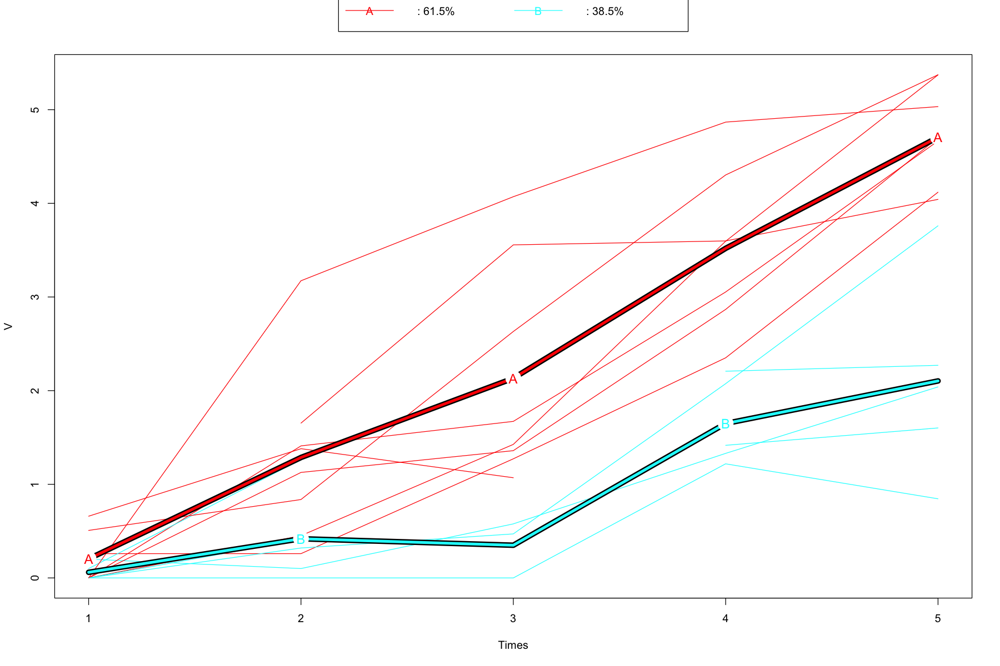

`geom_smooth()` using formula = 'y ~ x'


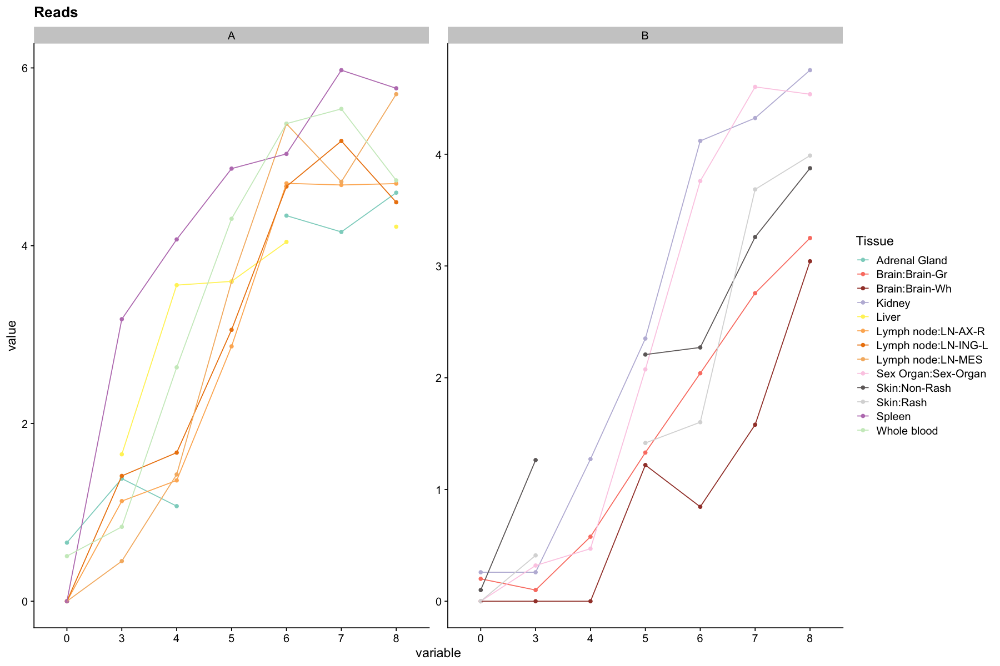

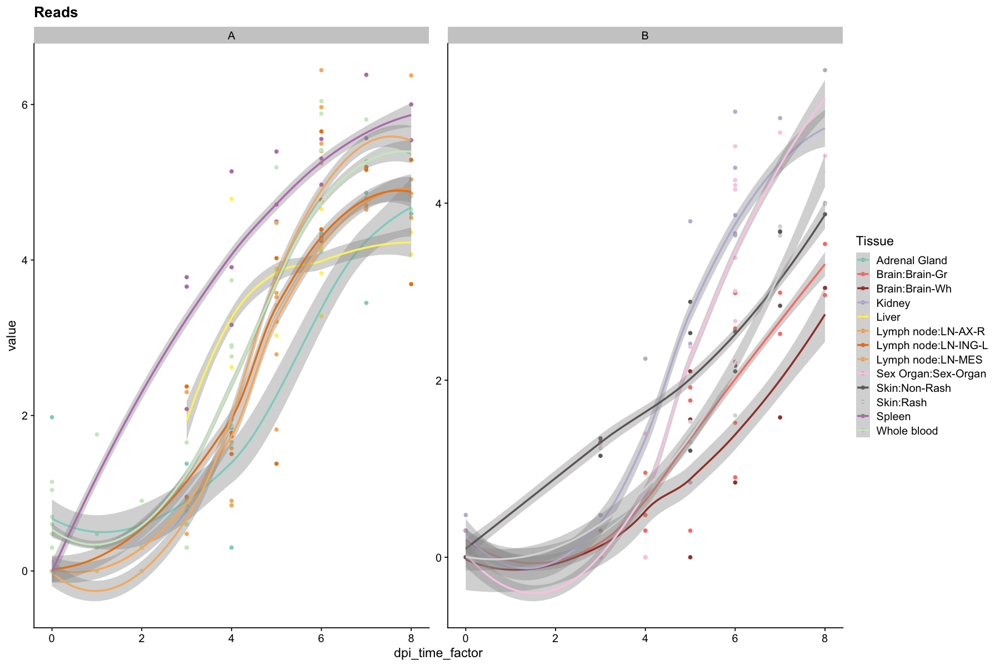

In [73]:
library(kml)
#dataCluster%>%filter(variable %in% c("quant.kulesh"))
data_wide <- dataCluster%>%filter(variable %in% c("viralReadCount")) %>% 
  dplyr::arrange(dpi_time_factor) %>% 
  tidyr::pivot_wider(id_cols = full.tissue, names_from = dpi_time_factor, values_from = mean)

data_cld <- kml::cld(as.data.frame(data_wide), timeInData = 2:6, maxNA = 2)
kml::kml(data_cld, nbClusters=2:3,nbRedrawing = 2,toPlot = 'none')
plot(data_cld, 2, parTraj=parTRAJ(col="clusters"), toPlot = "traj")

clusters<-getClusters(data_cld,2,2)
names(clusters)<-data_wide$full.tissue
data_wide["Cluster"]<-clusters
data.quant<-melt(data_wide)
#data.quant
                 
ggplot(data.quant,aes(x = variable,y=value,col=full.tissue))+theme_cowplot()+
geom_point()+geom_line(aes(group=full.tissue))+ 
facet_wrap(~ Cluster,scales = "free_y")+
scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)])+
ggtitle("Reads")

melt.logVirCounts.quant<-melt.logVirCounts%>%filter(variable %in% c("viralReadCount"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
melt.logVirCounts.quant["cluster"]<-clusters[melt.logVirCounts.quant$full.tissue]


ggplot(melt.logVirCounts.quant,aes(x = dpi_time_factor,y=value,col=full.tissue))+theme_cowplot()+
geom_point()+geom_smooth(se = TRUE,scale="free_y",method = "loess",level=0.3,span=1)+
ggtitle("Reads")+
facet_wrap(~ cluster,scales = "free")+scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)] )

 ~ Fast KmL ~
***************S


Using Tissue_Gene, Cluster as id variables



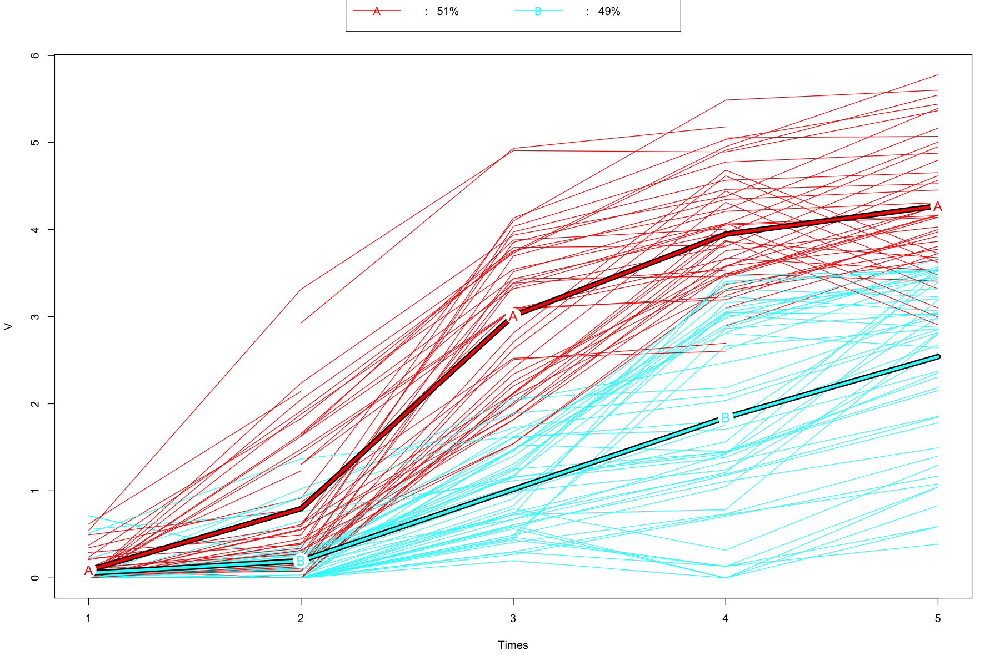

`geom_smooth()` using formula = 'y ~ x'


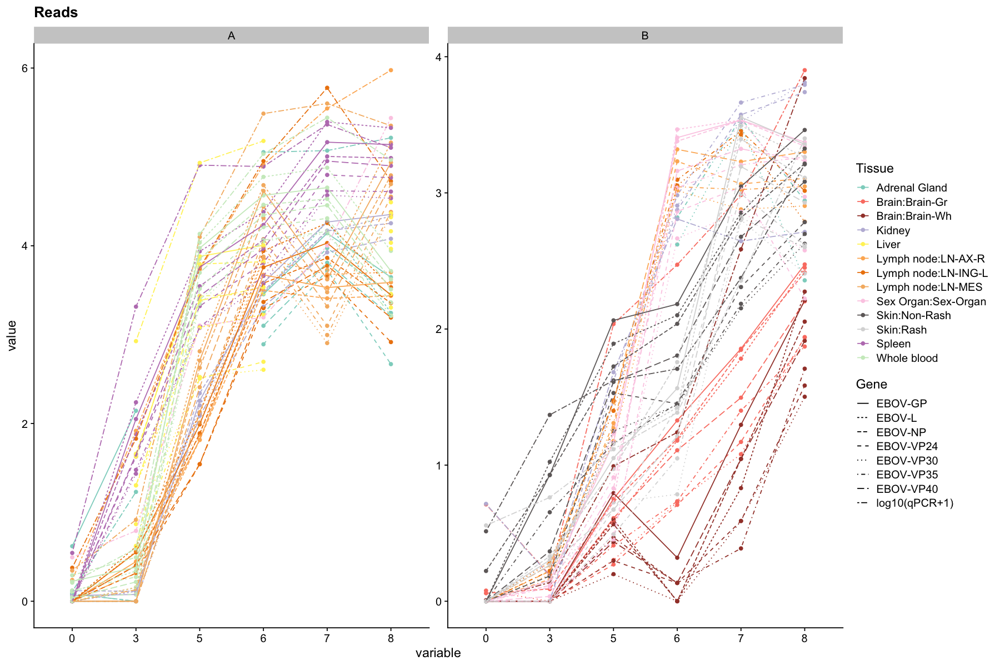

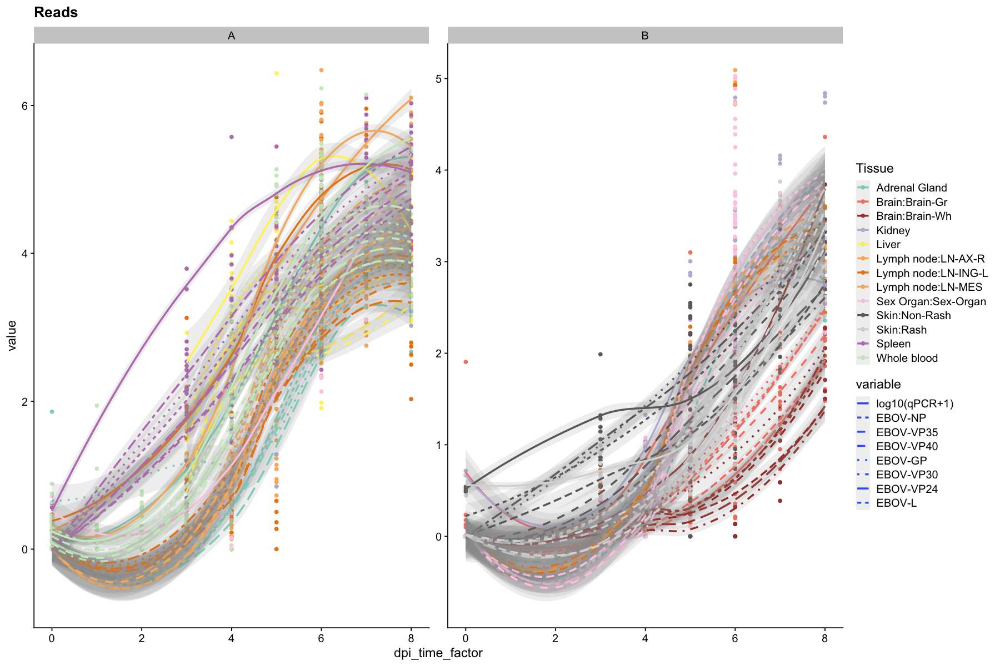

In [74]:
library(kml)
options(repr.plot.width = 15, repr.plot.height = 10)
dataCluster2<-mean.log.virus %>% filter(!full.tissue %in% c("Lung","PBMC"))%>%
filter(!dpi_time_factor %in% c(4,1,2))  %>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))
dataCluster2$Tissue_Gene<-paste0(dataCluster2$full.tissue,"_",dataCluster2$variable)
#dataCluster%>%filter(variable %in% c("quant.kulesh"))
data_wide <- dataCluster2 %>% dplyr::arrange(dpi_time_factor) %>% 
  tidyr::pivot_wider(id_cols = Tissue_Gene, names_from = dpi_time_factor, values_from = mean)
#data_wide
data_cld <- kml::cld(as.data.frame(data_wide), timeInData = 2:6, maxNA = 4)
kml::kml(data_cld, nbClusters=2:4,nbRedrawing = 5,toPlot = 'none')
plot(data_cld, 2, parTraj=parTRAJ(col="clusters"), toPlot = "traj")

clusters<-getClusters(data_cld,2,1)
names(clusters)<-data_wide$Tissue_Gene
data_wide["Cluster"]<-clusters
data.quant<-melt(data_wide)
data.quant<-data.quant %>% separate(Tissue_Gene, c("full.tissue", "Gene"),remove = FALSE,sep = "_")
####PLOT MEAN                
ggplot(data.quant,aes(x = variable,y=value,col=full.tissue,linetype=Gene))+theme_cowplot()+
geom_point()+geom_line(aes(group=Tissue_Gene))+ 
facet_wrap(~ Cluster,scales = "free_y")+
scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)])+
ggtitle("Reads")

melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
melt.logVirCounts.quant["cluster"]<-clusters[melt.logVirCounts.quant$Tissue_Gene]
##PLOT TREND
ggplot(melt.logVirCounts.quant %>% arrange(full.tissue),aes(x = dpi_time_factor,y=value,col=full.tissue,group=Tissue_Gene,
                                  linetype=variable))+theme_cowplot()+
geom_point()+geom_smooth(se = TRUE,scale="free_y",method = "loess",level=0.3,span=1,alpha=0.15)+
ggtitle("Reads")+
facet_wrap(~ cluster,scales = "free")+scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)] )

In [75]:
correlation<-as.data.frame(t(cor(se.qc.experimental$viralReadCount,
                                 t(counts(se.qc.experimental, normalized=TRUE)),method = "spearman")))

In [ ]:
#res2 <- rcorr(y=se.qc.experimental$viralReadCount,
#                                 x=t(counts(se.qc.experimental, normalized=TRUE)))
#res2

In [76]:
head(correlation) 


,V1
,<dbl>
ENSMMUG00000023296.4,0.12828800
ENSMMUG00000036181.3,0.07703617
ENSMMUG00000000634.4,-0.11654047
ENSMMUG00000037875.2,-0.04051041
ENSMMUG00000000632.4,-0.24670933
ENSMMUG00000064799.1,-0.16940609


In [77]:
table(rownames(correlation) %in% viralGenes)

topCorr<-rbind((correlation %>% filter(!rownames(correlation) %in% viralGenes) %>% top_n(8,V1)),
        (correlation %>% filter(!rownames(correlation) %in% viralGenes) %>% top_n(8,-V1)),
               (correlation %>% filter(rownames(correlation) %in% viralGenes) %>% top_n(3,V1)))

#topCor<-c(rownames(correlation %>% filter(!rownames(correlation) %in% viralGenes) %>% top_n(10,V1)))

topCorr$Direction<-ifelse(rownames(topCorr)%in% viralGenes,"Viral",ifelse(topCorr$V1 >0,"Correlated","Anticorrelated"))
topCorr
Direction<-topCorr$Direction
names(Direction)<-rownames(topCorr)
topCor<-rownames(topCorr)
Direction
topCor


FALSE  TRUE 
35395    10 

,V1,Direction
,<dbl>,<chr>
ENSMMUG00000053130.1,0.8045587,Correlated
ENSMMUG00000020903.3,0.8212680,Correlated
ENSMMUG00000012473.4,0.7303818,Correlated
ENSMMUG00000023780.4,0.7601398,Correlated
ENSMMUG00000008505.4,0.7200344,Correlated
ENSMMUG00000006441.4,0.7144630,Correlated
ENSMMUG00000019591.4,0.7100028,Correlated
ENSMMUG00000012600.4,0.7253544,Correlated
ENSMMUG00000047471.2,-0.5268463,Anticorrelated


ENSMMUG00000053130.1 ENSMMUG00000020903.3 ENSMMUG00000012473.4 
        "Correlated"         "Correlated"         "Correlated" 
ENSMMUG00000023780.4 ENSMMUG00000008505.4 ENSMMUG00000006441.4 
        "Correlated"         "Correlated"         "Correlated" 
ENSMMUG00000019591.4 ENSMMUG00000012600.4 ENSMMUG00000047471.2 
        "Correlated"         "Correlated"     "Anticorrelated" 
ENSMMUG00000019571.4 ENSMMUG00000012539.4 ENSMMUG00000009457.4 
    "Anticorrelated"     "Anticorrelated"     "Anticorrelated" 
ENSMMUG00000004688.4 ENSMMUG00000062501.1 ENSMMUG00000006093.4 
    "Anticorrelated"     "Anticorrelated"     "Anticorrelated" 
ENSMMUG00000062590.1              EBOV-NP              EBOV-GP 
    "Anticorrelated"              "Viral"              "Viral" 
              EBOV-L 
             "Viral"

[1] "ENSMMUG00000053130.1" "ENSMMUG00000020903.3" "ENSMMUG00000012473.4"
 [4] "ENSMMUG00000023780.4" "ENSMMUG00000008505.4" "ENSMMUG00000006441.4"
 [7] "ENSMMUG00000019591.4" "ENSMMUG00000012600.4" "ENSMMUG00000047471.2"
[10] "ENSMMUG00000019571.4" "ENSMMUG00000012539.4" "ENSMMUG00000009457.4"
[13] "ENSMMUG00000004688.4" "ENSMMUG00000062501.1" "ENSMMUG00000006093.4"
[16] "ENSMMUG00000062590.1" "EBOV-NP"              "EBOV-GP"             
[19] "EBOV-L"

In [78]:
topCor[(length(topCor)-2):length(topCor)]

[1] "EBOV-NP" "EBOV-GP" "EBOV-L"

[1]  19 262

`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor'. You can
override using the `.groups` argument.


 ~ Fast KmL ~
***************S


Using Tissue_Gene, Cluster as id variables



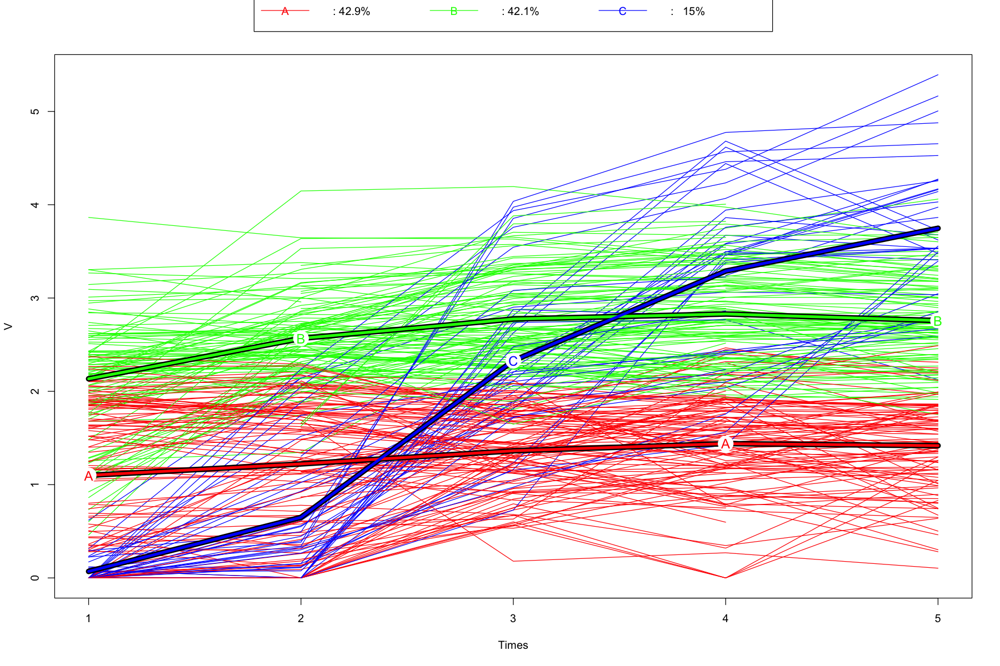

`geom_smooth()` using formula = 'y ~ x'


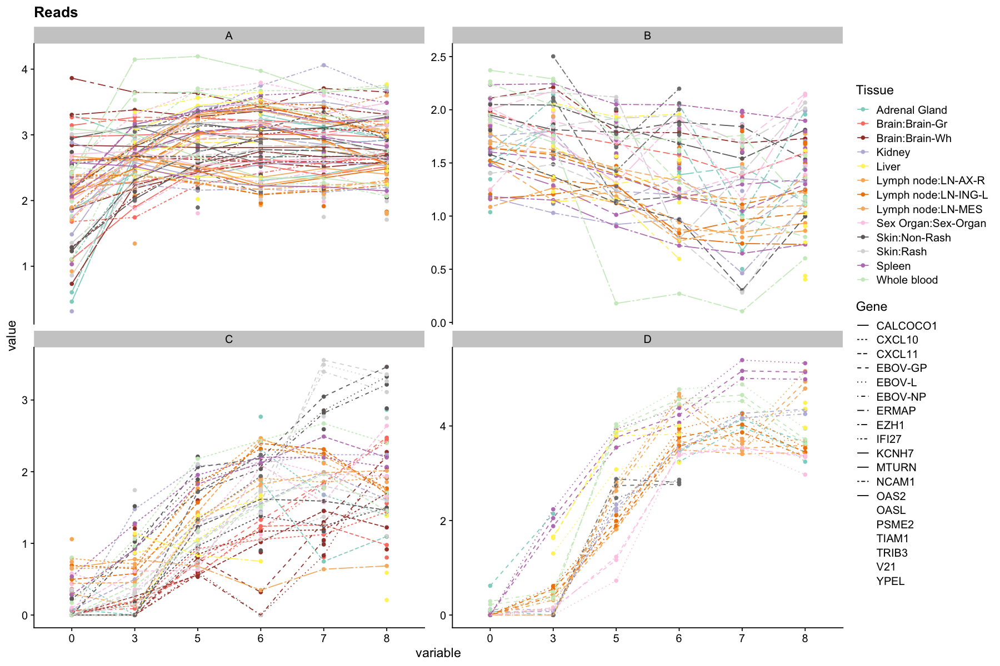

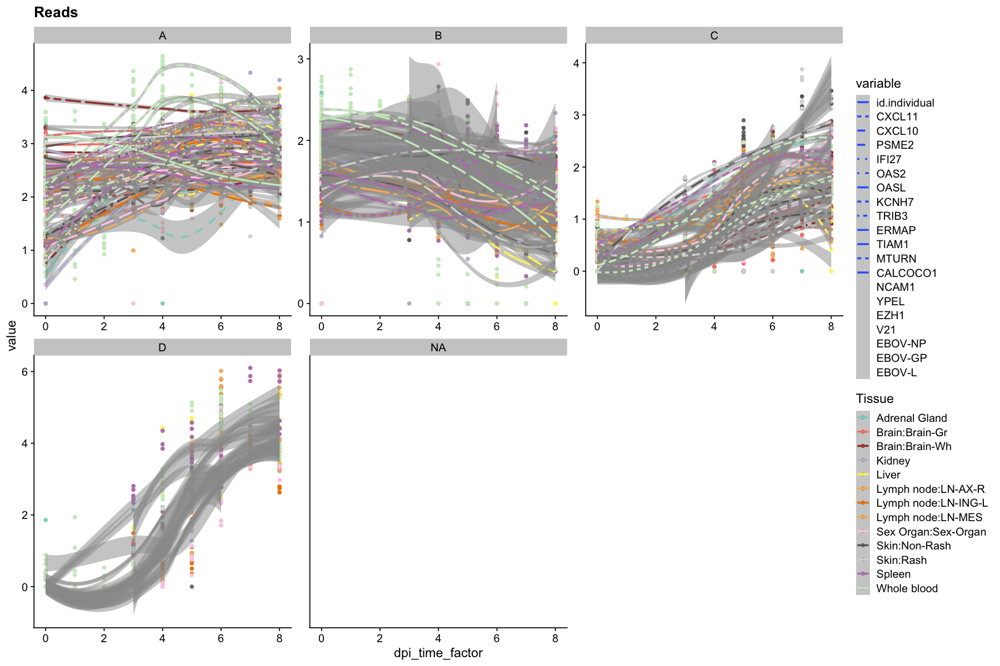

In [79]:
# this is the list of isg genes from the single-cell paper
#isg.set.for.scoring.fromSC <- c("ADAR","APOBEC3G","APOL6","B2M","BANK1","CASP1","DDX58","DDX60","DDX60L","DHX58","EIF2AK2","EPSTI1","FAS","GBP2","HERC5","HERC6","HIF1A","IFI16","IFI27","IFI35","IFI44","IFI6","IFIH1","IFIT3","IRF7","IRF9","ISG15","ISG20","LGALS3BP","MX1","MX2","NFKBIA","NMI","OAS2","OAS3","PARP14","PARP9","PML","PSMB8","PSMB9","PSME2","PTPN1","RARRES3","RSAD2","SAMD9","SAMD9L","SAMHD1","SP100","STAT1","STAT3","TRIM22","TRIM25","TRIM5","UBE2L6","VAMP5","WARS","XAF1","ZNFX1")
ntop = 500
rv <- rowVars(assay(vsd.qc))
select <- order(rv, decreasing = TRUE)[seq_len(min(ntop,length(rv)))]

#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[topCor,]

rownames(ISGs)<-rowData(ISGs)$external_gene_name
rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
logVirCounts[colnames(logVirCounts[-3])] <- sapply(logVirCounts[colnames(logVirCounts[-3])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)
melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"

mean.log.virus<-melt.logVirCounts %>%
  group_by(full.tissue, dpi_time_factor,variable) %>%
  summarise(mean=(mean(value,na.rm = TRUE)))

dataCluster2<-mean.log.virus %>% filter(!full.tissue %in% c("PBMC"))%>%
filter(!dpi_time_factor %in% c(4,1,2))  %>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer","id.individual"))
dataCluster2$Tissue_Gene<-paste0(dataCluster2$full.tissue,"_",dataCluster2$variable)
#dataCluster%>%filter(variable %in% c("quant.kulesh"))
data_wide2 <- dataCluster2 %>% dplyr::arrange(dpi_time_factor) %>% 
  tidyr::pivot_wider(id_cols = Tissue_Gene, names_from = dpi_time_factor, values_from = mean)
#data_wide
data_cld <- kml::cld(as.data.frame(data_wide2), timeInData = 2:6, maxNA = 4)
kml::kml(data_cld, nbClusters=2:4,nbRedrawing = 5,toPlot = 'none')
plot(data_cld, 3, parTraj=parTRAJ(col="clusters"), toPlot = "traj")

clusters<-getClusters(data_cld,4,1)
names(clusters)<-data_wide2$Tissue_Gene
data_wide2["Cluster"]<-clusters
data.quant<-melt(data_wide2)
data.quant<-data.quant %>% separate(Tissue_Gene, c("full.tissue", "Gene"),remove = FALSE,sep = "_")
####PLOT MEAN                
ggplot(data.quant,aes(x = variable,y=value,col=full.tissue,linetype=Gene))+theme_cowplot()+
geom_point()+geom_line(aes(group=Tissue_Gene))+ 
facet_wrap(~ Cluster,scales = "free_y")+
scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)])+
ggtitle("Reads")




melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
melt.logVirCounts.quant["cluster"]<-clusters[melt.logVirCounts.quant$Tissue_Gene]
##PLOT TREND
ggplot(melt.logVirCounts.quant %>% arrange(full.tissue),aes(x = dpi_time_factor,y=value,col=full.tissue,group=Tissue_Gene,
                                  linetype=variable))+theme_cowplot()+
geom_point()+geom_smooth(se = TRUE,scale="free_y",method = "loess",level=0.3,span=1,alpha=0.5)+
ggtitle("Reads")+
facet_wrap(~ cluster,scales = "free")+scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)] )

In [80]:
head(data_wide2)

data_wide3<-rbind(data_wide2)
head(data_wide3)


Tissue_Gene,0,3,5,6,7,8,Cluster
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
Adrenal Gland_CXCL11,0.08304084,0.000000,NA,1.876652,0.747629,1.096583,C
Adrenal Gland_CXCL10,0.50791692,0.000000,NA,2.306049,1.674863,1.390975,C
Adrenal Gland_PSME2,1.24223251,2.299480,NA,2.360216,2.207239,2.862509,A
Adrenal Gland_IFI27,1.10692717,2.479195,NA,3.105815,3.083861,3.143730,A
Adrenal Gland_OAS2,0.46151506,2.637117,NA,3.306844,3.110208,2.937312,A
Adrenal Gland_OASL,0.00000000,1.279351,NA,2.766385,2.125861,2.863434,C


Tissue_Gene,0,3,5,6,7,8,Cluster
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
Adrenal Gland_CXCL11,0.08304084,0.000000,NA,1.876652,0.747629,1.096583,C
Adrenal Gland_CXCL10,0.50791692,0.000000,NA,2.306049,1.674863,1.390975,C
Adrenal Gland_PSME2,1.24223251,2.299480,NA,2.360216,2.207239,2.862509,A
Adrenal Gland_IFI27,1.10692717,2.479195,NA,3.105815,3.083861,3.143730,A
Adrenal Gland_OAS2,0.46151506,2.637117,NA,3.306844,3.110208,2.937312,A
Adrenal Gland_OASL,0.00000000,1.279351,NA,2.766385,2.125861,2.863434,C


In [81]:
melt.logVirCounts.quant

sample,dpi_time_factor,full.tissue,variable,value,Tissue_Gene,cluster
<chr>,<dbl>,<chr>,<fct>,<dbl>,<chr>,<fct>
A0001_S121_L002,6,Spleen,id.individual,NA,Spleen_id.individual,NA
A0002_S124_L002,6,Kidney,id.individual,NA,Kidney_id.individual,NA
A0003,6,Liver,id.individual,NA,Liver_id.individual,NA
A0006_S89_L002,6,Brain:Brain-Gr,id.individual,NA,Brain:Brain-Gr_id.individual,NA
A0007_S17_L001,6,Sex Organ:Sex-Organ,id.individual,NA,Sex Organ:Sex-Organ_id.individual,NA
A0008_S140_L002,6,Lymph node:LN-AX-R,id.individual,NA,Lymph node:LN-AX-R_id.individual,NA
A0009_S139_L002,6,Lymph node:LN-ING-L,id.individual,NA,Lymph node:LN-ING-L_id.individual,NA
A0010_S19_L001,6,Lymph node:LN-MES,id.individual,NA,Lymph node:LN-MES_id.individual,NA
A0012_S16_L001,6,Sex Organ:Sex-Organ,id.individual,NA,Sex Organ:Sex-Organ_id.individual,NA


Loading required package: grid

ComplexHeatmap version 2.15.4
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))




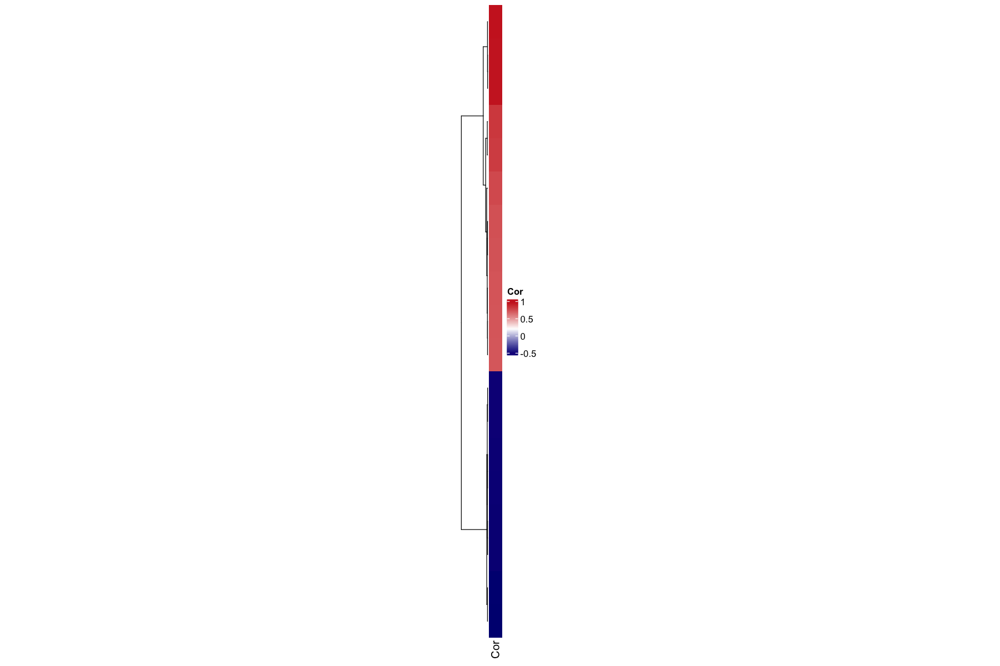

In [82]:
library(ComplexHeatmap)
Heatmap(topCorr$V1, name = "Cor",
              width = unit(0.5, "cm"),col = colorRampPalette(c("navy", "white","firebrick3"))(100))


In [83]:
data.pheatma<-melt(data_wide3 %>% separate(Tissue_Gene, c("full.tissue", "Gene"),remove = FALSE,sep = "_"))
data.pheatma

Using Tissue_Gene, full.tissue, Gene, Cluster as id variables



Tissue_Gene,full.tissue,Gene,Cluster,variable,value
<chr>,<chr>,<chr>,<fct>,<fct>,<dbl>
Adrenal Gland_CXCL11,Adrenal Gland,CXCL11,C,0,0.08304084
Adrenal Gland_CXCL10,Adrenal Gland,CXCL10,C,0,0.50791692
Adrenal Gland_PSME2,Adrenal Gland,PSME2,A,0,1.24223251
Adrenal Gland_IFI27,Adrenal Gland,IFI27,A,0,1.10692717
Adrenal Gland_OAS2,Adrenal Gland,OAS2,A,0,0.46151506
Adrenal Gland_OASL,Adrenal Gland,OASL,C,0,0.00000000
Adrenal Gland_KCNH7,Adrenal Gland,KCNH7,A,0,0.60324174
Adrenal Gland_TRIB3,Adrenal Gland,TRIB3,C,0,0.30052625
Adrenal Gland_ERMAP,Adrenal Gland,ERMAP,B,0,1.51903874


In [84]:
library(viridis)
library(ggplotify)
data.pheatma<-melt(data_wide3 %>% separate(Tissue_Gene, c("full.tissue", "Gene"),remove = FALSE,sep = "_"))
data.pheatma$newname<-paste0(data.pheatma$full.tissue,"_",data.pheatma$variable)
data.pheatma<-data.pheatma %>% tidyr::pivot_wider(id_cols = c(newname,full.tissue,variable), names_from =Gene, values_from = value,)
head(data.pheatma)
data.pheatma <- na.omit(data.pheatma) 

Cluster1<-c("Adrenal Gland","Lymph node:LN-AX-R","Lymph node:LN-ING-L","Lymph node:LN-MES","Whole blood")
Cluster2<-c("Brain:Brain-Gr","Brain:Brain-Wh","Kidney","Lung","Sex Organ:Sex-Organ","Skin:Non-Rash","Skin:Rash")
Cluster3<-c("Liver","Spleen")

labelCluster<-ifelse(data.pheatma$full.tissue %in% Cluster1,
                     "Cluster2",ifelse(data.pheatma$full.tissue %in% Cluster2,"Cluster3","Cluster1"))
columnsplit<-data.frame(labelCluster=labelCluster,row.names = (data.pheatma$newname))
data.p<-data.pheatma

# Data frame with column annotations.
mat_col <- data.frame(Tissue = data.p$full.tissue,DPI = data.p$variable,Cluster= columnsplit$labelCluster)
rownames(mat_col) <- data.p$newname
# List with colors for each annotation.
time=brewer.pal(n = 6, name = "Blues")
names(time)=as.character(unique(mat_col$DPI))
Cluster<-c("#f7f7f7","black","#6c6c6c")
names(Cluster)<-c("Cluster1","Cluster2","Cluster3")
mat_colors <- list(Tissue=color_ft[unique(mat_col$Tissue)],DPI=time,Cluster=Cluster)
data_ph<-t(data.p[4:ncol(data.p)])
colnames(data_ph)<-data.p$newname


annotation_row=data.frame(GeneType=ifelse(rownames(data_ph) %in% viralGenes,"Viral","Correlated"))

options(repr.plot.width=12,repr.plot.height=5)

ht=ComplexHeatmap::pheatmap(data_ph,color = colorRampPalette(c("navy", "white","firebrick3"))(100),
                   cluster_cols = FALSE,cluster_rows = TRUE,annotation_row=topCorr['Direction'],scale="row",
                   annotation_col=mat_col,annotation_color=mat_colors,row_split=topCorr$Direction,
                   drop_levels    = TRUE ,show_colnames=FALSE,column_split=mat_col$Cluster)
ht=Heatmap(topCorr$V1, name = "Cor",
              width = unit(0.5, "cm"),col = colorRampPalette(c("navy", "white","firebrick3"))(100))+ht



###Cluster2

library(GetoptLong)
library(ComplexHeatmap)

pdf(qq("../heatmap_ViralISG_complex.pdf"), width = 13, height = 5)
draw(ht)
dev.off()



#ggsave("heatmap_ViralISG_complex.pdf",width=30,height=5)



Loading required package: viridisLite

Using Tissue_Gene, full.tissue, Gene, Cluster as id variables



newname,full.tissue,variable,CXCL11,CXCL10,PSME2,IFI27,OAS2,OASL,KCNH7,⋯,TIAM1,MTURN,CALCOCO1,NCAM1,YPEL,EZH1,V21,EBOV-NP,EBOV-GP,EBOV-L
<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Adrenal Gland_0,Adrenal Gland,0,0.08304084,0.50791692,1.242233,1.106927,0.4615151,0.0000000,0.6032417,⋯,1.404498,1.479622,1.856838,3.303658,1.036931,1.597474,1.346645,0.08304084,0.61965566,0
Brain:Brain-Gr_0,Brain:Brain-Gr,0,0.00000000,0.06275656,2.036590,1.679246,1.1082148,0.3629112,2.1884186,⋯,2.849175,3.144801,2.971963,3.268601,1.846084,2.618087,1.953149,0.05900006,0.00000000,0
Brain:Brain-Wh_0,Brain:Brain-Wh,0,0.00000000,0.00000000,1.879649,1.289570,0.7323774,0.0000000,1.8589983,⋯,2.527816,3.863705,2.841615,3.304324,2.260719,2.615762,1.990319,0.00000000,0.00000000,0
Kidney_0,Kidney,0,0.07140370,0.00000000,2.371193,1.843192,1.4854515,0.3141779,1.7340618,⋯,1.849293,1.936597,2.883063,1.174229,2.061351,2.395823,1.680869,0.11900809,0.06530787,0
Lymph node:LN-AX-R_0,Lymph node:LN-AX-R,0,0.43969832,0.78842370,2.284959,1.700522,2.2312135,0.9225497,2.1180837,⋯,2.419343,1.518248,2.597678,1.086156,1.908086,2.395582,1.857996,0.00000000,0.00000000,0
Lymph node:LN-ING-L_0,Lymph node:LN-ING-L,0,0.49703817,0.69366325,2.342790,1.888848,2.2004657,1.0964768,2.0658495,⋯,2.433733,1.521020,2.617312,1.163425,1.860812,2.366777,1.821197,0.00000000,0.00000000,0


pdf 
  2

In [85]:
data.p

newname,full.tissue,variable,CXCL11,CXCL10,PSME2,IFI27,OAS2,OASL,KCNH7,⋯,TIAM1,MTURN,CALCOCO1,NCAM1,YPEL,EZH1,V21,EBOV-NP,EBOV-GP,EBOV-L
<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Adrenal Gland_0,Adrenal Gland,0,0.08304084,0.50791692,1.242233,1.106927,0.4615151,0.0000000,0.6032417,⋯,1.404498,1.479622,1.856838,3.3036582,1.036931,1.597474,1.346645,0.08304084,0.61965566,0.0000000
Brain:Brain-Gr_0,Brain:Brain-Gr,0,0.00000000,0.06275656,2.036590,1.679246,1.1082148,0.3629112,2.1884186,⋯,2.849175,3.144801,2.971963,3.2686011,1.846084,2.618087,1.953149,0.05900006,0.00000000,0.0000000
Brain:Brain-Wh_0,Brain:Brain-Wh,0,0.00000000,0.00000000,1.879649,1.289570,0.7323774,0.0000000,1.8589983,⋯,2.527816,3.863705,2.841615,3.3043239,2.260719,2.615762,1.990319,0.00000000,0.00000000,0.0000000
Kidney_0,Kidney,0,0.07140370,0.00000000,2.371193,1.843192,1.4854515,0.3141779,1.7340618,⋯,1.849293,1.936597,2.883063,1.1742288,2.061351,2.395823,1.680869,0.11900809,0.06530787,0.0000000
Lymph node:LN-AX-R_0,Lymph node:LN-AX-R,0,0.43969832,0.78842370,2.284959,1.700522,2.2312135,0.9225497,2.1180837,⋯,2.419343,1.518248,2.597678,1.0861557,1.908086,2.395582,1.857996,0.00000000,0.00000000,0.0000000
Lymph node:LN-ING-L_0,Lymph node:LN-ING-L,0,0.49703817,0.69366325,2.342790,1.888848,2.2004657,1.0964768,2.0658495,⋯,2.433733,1.521020,2.617312,1.1634251,1.860812,2.366777,1.821197,0.00000000,0.00000000,0.0000000
Lymph node:LN-MES_0,Lymph node:LN-MES,0,0.29450404,0.64667702,2.220163,1.895077,2.1312057,1.2555760,2.1902513,⋯,2.425667,1.778994,2.673800,0.6617365,1.245090,2.316577,1.681778,0.00000000,0.00000000,0.0000000
Sex Organ:Sex-Organ_0,Sex Organ:Sex-Organ,0,0.10045228,0.57788628,2.283855,2.575285,2.0005735,1.0366302,1.7540999,⋯,2.647472,2.004636,2.706225,2.0166642,1.950122,2.385729,1.874669,0.00000000,0.00000000,0.0000000
Skin:Non-Rash_0,Skin:Non-Rash,0,0.00000000,0.00000000,2.163103,2.170957,1.2291465,0.2325070,1.2820226,⋯,2.738616,1.950595,2.945724,2.0492571,2.257394,2.553781,1.806876,0.22251440,0.00000000,0.0000000


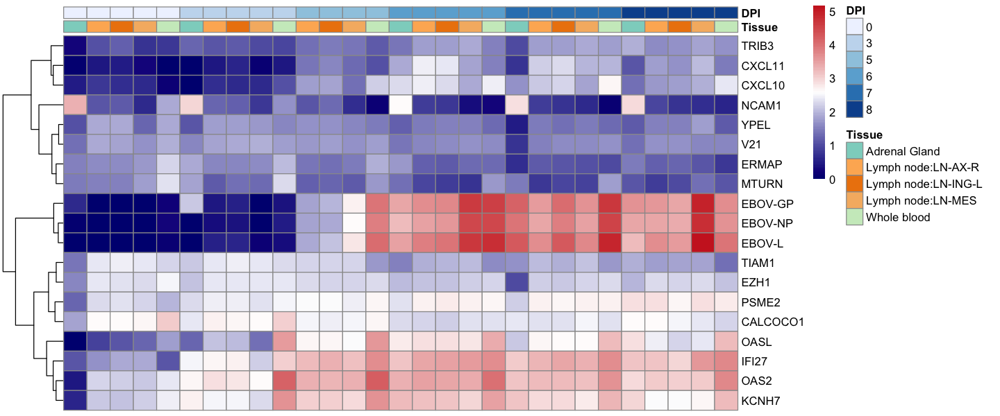

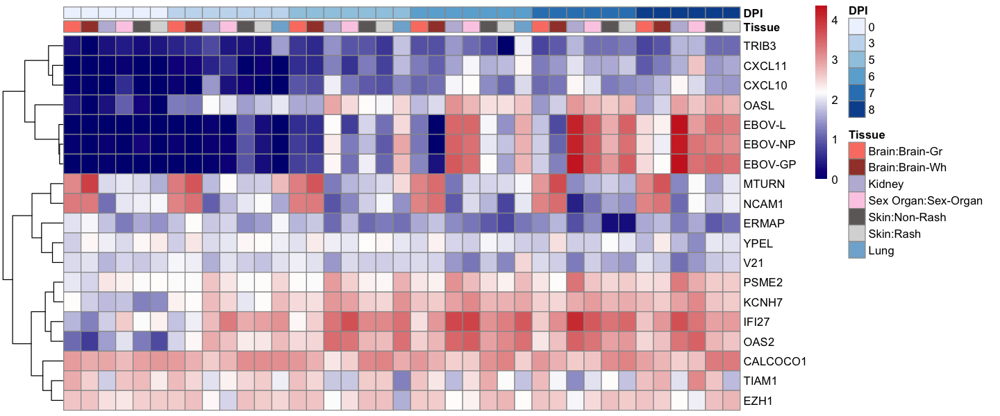

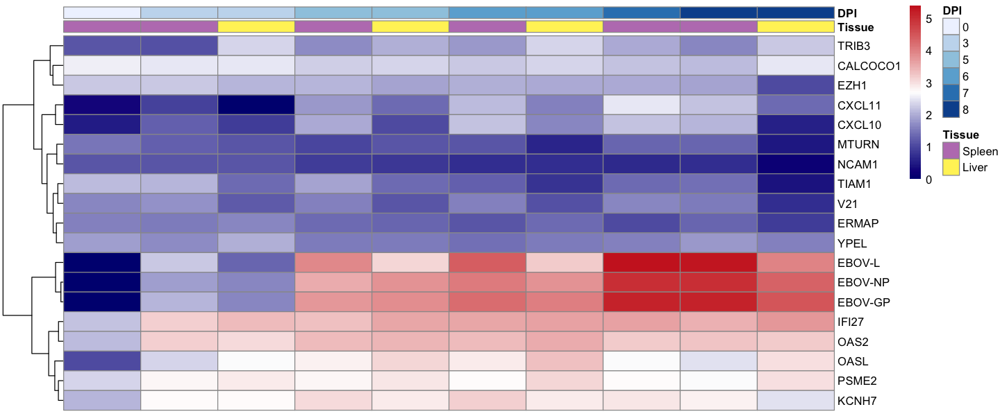

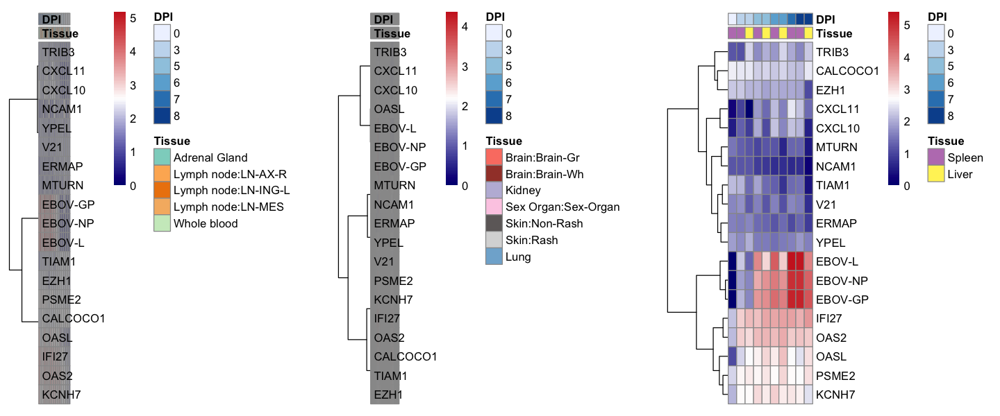

In [86]:
###Per cluster
###Cluster1
data.p<-data.pheatma %>% filter(full.tissue %in% Cluster1)
# Data frame with column annotations.
mat_col <- data.frame(Tissue = data.p$full.tissue,DPI = data.p$variable)
rownames(mat_col) <- data.p$newname


# List with colors for each annotation.
time=brewer.pal(n = 6, name = "Blues")
names(time)=as.character(unique(mat_col$DPI))
mat_colors <- list(Tissue=color_ft[unique(mat_col$Tissue)],DPI=time)

data_ph<-t(data.p[4:ncol(data.p)])
colnames(data_ph)<-data.p$newname


options(repr.plot.width=12,repr.plot.height=5)
Ph1<-as.ggplot(pheatmap::pheatmap(data_ph,color = colorRampPalette(c("navy", "white","firebrick3"))(100),
                   cluster_cols = FALSE,cluster_rows = TRUE,
                   annotation_col=mat_col,annotation_color=mat_colors,
                   drop_levels       = TRUE ,show_colnames=FALSE))
###Cluster2
data.p<-data.pheatma %>% filter(full.tissue %in% Cluster2)
# Data frame with column annotations.
mat_col <- data.frame(Tissue = data.p$full.tissue,DPI = data.p$variable)
rownames(mat_col) <- data.p$newname


# List with colors for each annotation.
time=brewer.pal(n = 6, name = "Blues")
names(time)=as.character(unique(mat_col$DPI))
mat_colors <- list(Tissue=color_ft[unique(mat_col$Tissue)],DPI=time)

data_ph<-t(data.p[4:ncol(data.p)])
colnames(data_ph)<-data.p$newname


options(repr.plot.width=12,repr.plot.height=5)
Ph2<-as.ggplot(pheatmap::pheatmap(data_ph,color =  colorRampPalette(c("navy", "white","firebrick3"))(100),
                   cluster_cols = FALSE,cluster_rows = TRUE,
                   annotation_col=mat_col,annotation_color=mat_colors,
                   drop_levels       = TRUE ,show_colnames=FALSE))
###Cluster3
data.p<-data.pheatma %>% filter(full.tissue %in% Cluster3)
# Data frame with column annotations.
mat_col <- data.frame(Tissue = data.p$full.tissue,DPI = data.p$variable)
rownames(mat_col) <- data.p$newname


# List with colors for each annotation.
time=brewer.pal(n = 6, name = "Blues")
names(time)=as.character(unique(mat_col$DPI))
mat_colors <- list(Tissue=color_ft[unique(mat_col$Tissue)],DPI=time)

data_ph<-t(data.p[4:ncol(data.p)])
colnames(data_ph)<-data.p$newname


options(repr.plot.width=12,repr.plot.height=5)
Ph3<-as.ggplot(pheatmap::pheatmap(data_ph,color =  colorRampPalette(c("navy", "white","firebrick3"))(100),
                   cluster_cols = FALSE,cluster_rows = TRUE,
                   annotation_col=mat_col,annotation_color=mat_colors,
                   drop_levels       = TRUE ,show_colnames=FALSE))

Ph1+Ph2+Ph3
#ggsave("heatmap_ViralISG.pdf",width=30,height=5)

In [87]:
genes<-c("CILP", 'LAMA3', 'COL17A1')
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp

genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes,]

rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
logVirCounts[colnames(logVirCounts[-3])] <- sapply(logVirCounts[colnames(logVirCounts[-3])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)
melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"


melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
melt.logVirCounts.quant["cluster"]<-clusters[melt.logVirCounts.quant$Tissue_Gene]
##PLOT TREND
Filtered<-melt.logVirCounts.quant %>% filter(full.tissue %in% 
                                   c("Lymph node:LN-AX-R", "Lymph node:LN-ING-L","Lymph node:LN-MES","Spleen"))
LNB<-ggplot(Filtered %>% arrange(full.tissue),aes(x = dpi_time_factor,y=value,col=full.tissue,group=Tissue_Gene,
                                  linetype=variable))+theme_cowplot()+
geom_point()+geom_smooth(se = TRUE,scale="free_y",method = "loess",level=0.3,span=1,alpha=0.5)+
ggtitle("")+
        scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)],guide = "none" )

[1]   3 262

[1]   5 262

,quant.kulesh,dpi_time_factor,full.tissue,viralReadCount,id.individual,S100A9,CTSS,VCAN,CD14,FCN1
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
A0001_S121_L002,8.37e+04,6,Spleen,93139,RA1803,2.54904541438137,2.66700315915898,2.35993985829618,2.36237594227714,2.6189678224127
A0002_S124_L002,1.61e+02,6,Kidney,4341,RA1803,2.12320812023585,2.11269578526098,2.30679928079771,2.14842685262966,2.35809177538375
A0003,4.74e+03,6,Liver,19278,RA1803,2.38625094387245,2.20604975033913,2.57291209300244,3.06749120009154,3.01690382931127
A0006_S89_L002,4.60e+01,6,Brain:Brain-Gr,32,RA1803,0.867138856289334,1.76118516748088,1.92888055755666,1.33903439743889,1.18933876875317
A0007_S17_L001,1.34e+02,6,Sex Organ:Ovary,2413,RA1803,1.93167623327034,2.14287797428361,2.58703003143212,2.3462088158269,1.46945305026772
A0008_S140_L002,1.10e+04,6,Lymph node:LN-AX-R,12850,RA1803,2.25756086597579,2.74460412043399,1.67832718967398,2.02472629336874,1.63289697605641


`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor',
'viralReadCount'. You can override using the `.groups` argument.


[1] "Adrenal Gland"       "Brain:Brain-Gr"      "Brain:Brain-Wh"     
 [4] "Kidney"              "Liver"               "Lung"               
 [7] "Lymph node:LN-AX-R"  "Lymph node:LN-ING-L" "Lymph node:LN-MES"  
[10] "Sex Organ:Sex-Organ" "Skin:Non-Rash"       "Skin:Rash"          
[13] "Spleen"

`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor',
'viralReadCount'. You can override using the `.groups` argument.
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


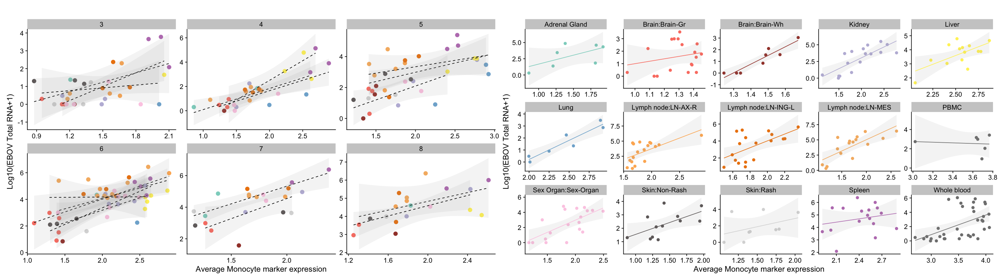

In [88]:
genes<-c("CTSS","VCAN","FCN1","CD14","S100A9")
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp

genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes,]
rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
head(logVirCounts)
logVirCounts[colnames(logVirCounts[c(-3,-5)])] <- sapply(logVirCounts[colnames(logVirCounts[c(-3,-5)])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)



melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue","id.individual","viralReadCount"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"


melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(melt.logVirCounts$full.tissue))
##PLOT TREND



Filtered<-melt.logVirCounts.quant %>% group_by(full.tissue,dpi_time_factor,viralReadCount,id.individual) %>%
  summarise(mean=(mean(value,na.rm = TRUE)))%>% filter(!full.tissue %in% c("Whole blood","PBMC")) %>% filter(!dpi_time_factor %in% 
                                   c("0"))

(unique(Filtered$full.tissue))

options(repr.plot.width=12,repr.plot.height=7)


P1<-ggplot(Filtered %>% arrange(full.tissue),aes(y= log10(viralReadCount+1),x=mean,col=full.tissue,group=id.individual))+theme_cowplot()+
geom_point( size = 3)+geom_smooth(se = TRUE,scale="free_y",method = "loess",span=1,alpha=0.1)+
ggtitle("")+facet_wrap(~ id.individual,scales = "free")+
scale_color_manual(name="Tissue",values =color_ft[unique(Filtered$full.tissue)] ,guide="none")+
xlab("Average Monocyte marker expression")+
ylab("Log10(EBOV Total RNA+1)")

P2<-ggplot(Filtered %>% arrange(full.tissue),aes(y= log10(viralReadCount+1),
                                                 x=mean,col=full.tissue,group=id.individual  ))+theme_cowplot()+
geom_point( size = 3)+geom_smooth(se = TRUE,scale="free_y",
                                  method = "lm",span=2,alpha=0.1,size=0.5,color="black",linetype="dashed")+
ggtitle("")+facet_wrap(~ dpi_time_factor,scales = "free", ncol = 3)+
scale_color_manual(name="Tissue",values =color_ft[unique(Filtered$full.tissue)],guide="none" )+
xlab("Average Monocyte marker expression")+
ylab("Log10(EBOV Total RNA+1)")+theme_cowplot()

Filtered2<-melt.logVirCounts.quant %>% group_by(full.tissue,dpi_time_factor,viralReadCount,id.individual) %>%
  summarise(mean=(mean(value,na.rm = TRUE)))%>% filter(!full.tissue %in% c("Whole bloosd","PBdMC")) %>% filter(!dpi_time_factor %in% 
                                   c("0"))

P3<-ggplot(Filtered2 %>% arrange(full.tissue),aes(y= log10(viralReadCount+1),x=mean,col=full.tissue))+theme_cowplot()+
geom_point(size = 2)+geom_smooth(se = TRUE,scale="free_y",method = "lm",span=2,alpha=0.1,size=0.5)+
ggtitle("")+scale_color_manual(name="Tissue",values =color_ft[unique(Filtered$full.tissue)],guide="none" )+
facet_wrap(~ full.tissue,scales = "free", ncol = 5)+xlab("Average Monocyte marker expression")+
ylab("Log10(EBOV Total RNA+1)")

options(repr.plot.width=25,repr.plot.height=7)

P2+P3

The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 



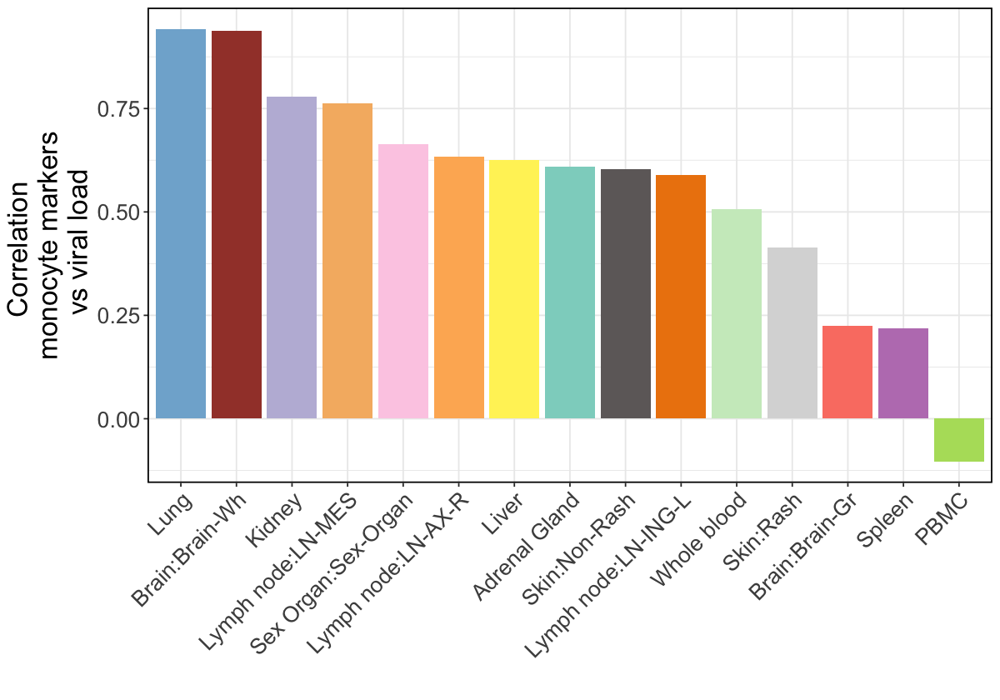

In [89]:
corn<-Filtered2 %>% group_by(full.tissue) %>%
  summarise(cor=(cor(log10(viralReadCount+1),mean)))
options(repr.plot.width=10,repr.plot.height=7)
Mono<-ggplot(corn, aes(x=fct_reorder(full.tissue, desc(cor)),y=cor,fill=full.tissue)) +
    geom_bar(stat='identity') + scale_fill_manual(values = color_ft[unique(corn$full.tissue)],name="Tissue")+
    theme_bw() + ylab("Correlation \n monocyte markers \n vs viral load")+
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) + 
    scale_x_discrete("") +
 theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))
Mono+ Seurat::NoLegend()
ggsave("../MonoCorr.pdf",width = 10,height = 8)

`geom_smooth()` using formula = 'y ~ x'


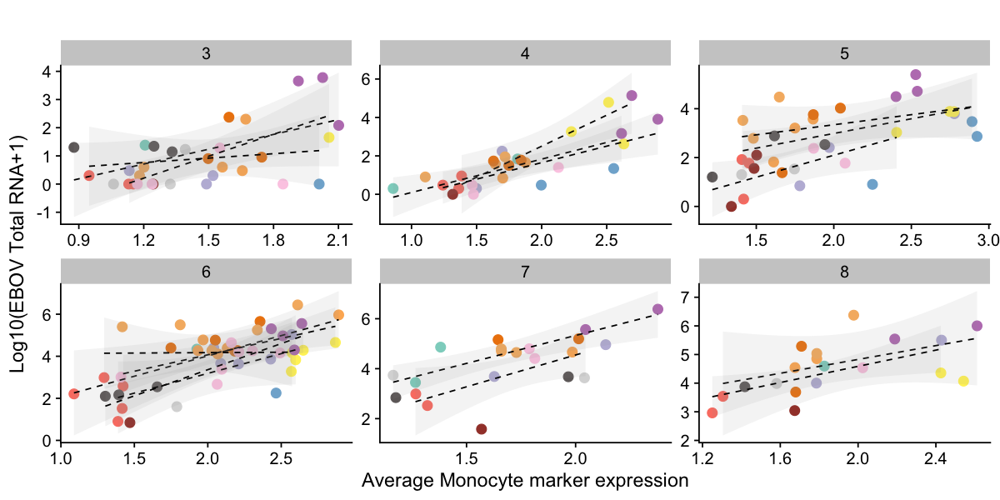

`geom_smooth()` using formula = 'y ~ x'


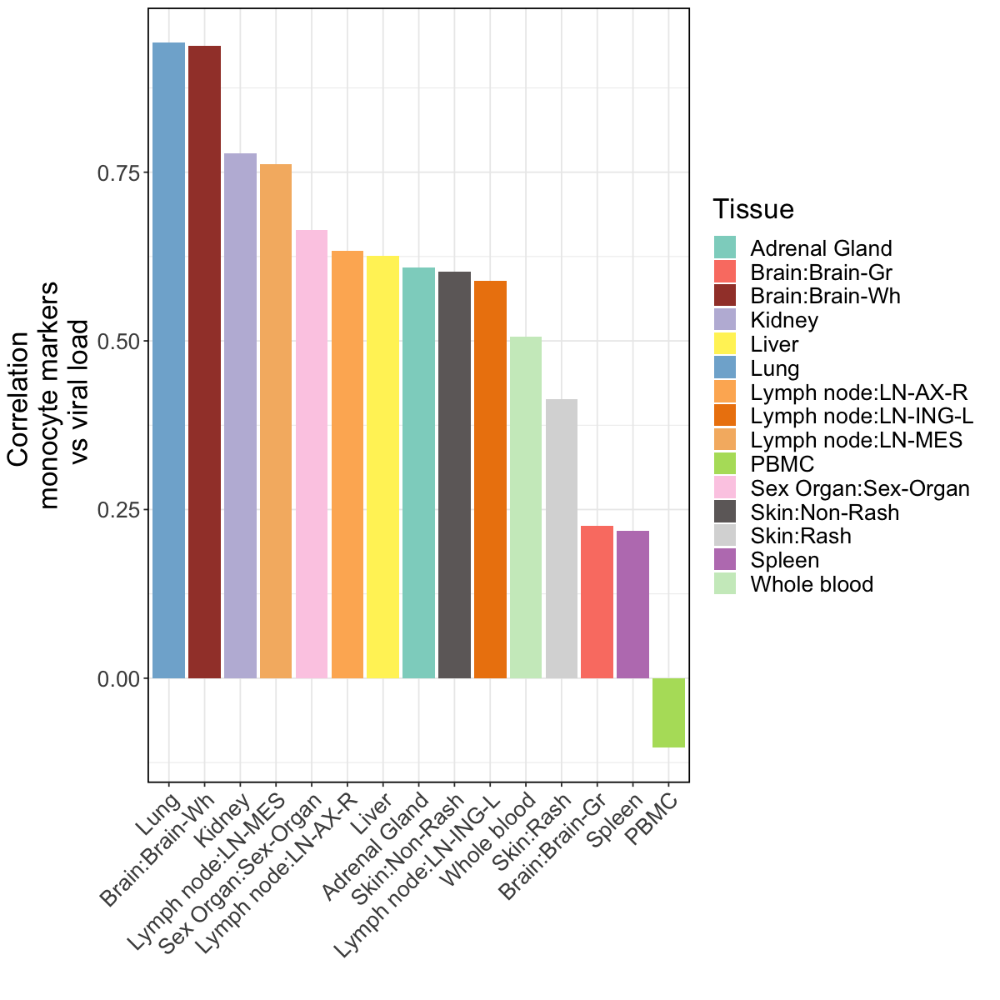

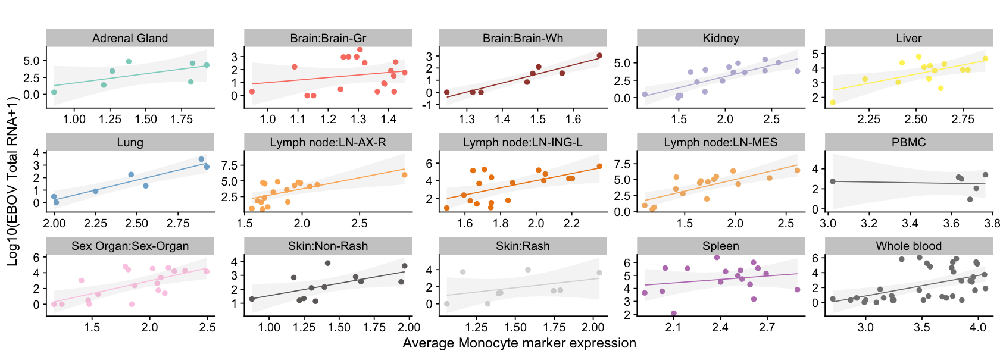

In [90]:
options(repr.plot.width=10,repr.plot.height=5)

P2
options(repr.plot.width=10,repr.plot.height=10)
Mono
options(repr.plot.width=14,repr.plot.height=5)
P3



[1]   6 262

,quant.kulesh,dpi_time_factor,full.tissue,viralReadCount,id.individual,SELL,PPBP,CD4,CD3D,CD8A,HBA
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
A0001_S121_L002,8.37e+04,6,Spleen,93139,RA1803,2.45006634688179,2.27375282620552,2.29269824078557,1.6544585499495,1.98672368880547,1.00082983843573
A0002_S124_L002,1.61e+02,6,Kidney,4341,RA1803,1.39479884161138,1.13684451437172,2.03098507591211,0.412962395121466,0.412962395121466,0.412962395121466
A0003,4.74e+03,6,Liver,19278,RA1803,1.4441213516532,0.63855041463184,1.97174089935277,0,0.886559824773337,0.50970533270676
A0006_S89_L002,4.60e+01,6,Brain:Brain-Gr,32,RA1803,0.333884013685734,0,1.81823526824789,0,0.703299012427433,0
A0007_S17_L001,1.34e+02,6,Sex Organ:Ovary,2413,RA1803,0.868192629577764,0.173462316884873,2.41941866627741,0.173462316884873,0.393196394275751,0
A0008_S140_L002,1.10e+04,6,Lymph node:LN-AX-R,12850,RA1803,2.77226972866665,0.224405456174749,2.72012201523258,2.12798527573669,2.29413292956883,0.126538441178134


`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor',
'viralReadCount'. You can override using the `.groups` argument.


[1] "Adrenal Gland"       "Brain:Brain-Gr"      "Brain:Brain-Wh"     
 [4] "Kidney"              "Liver"               "Lung"               
 [7] "Lymph node:LN-AX-R"  "Lymph node:LN-ING-L" "Lymph node:LN-MES"  
[10] "Sex Organ:Sex-Organ" "Skin:Non-Rash"       "Skin:Rash"          
[13] "Spleen"

`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor',
'viralReadCount'. You can override using the `.groups` argument.
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


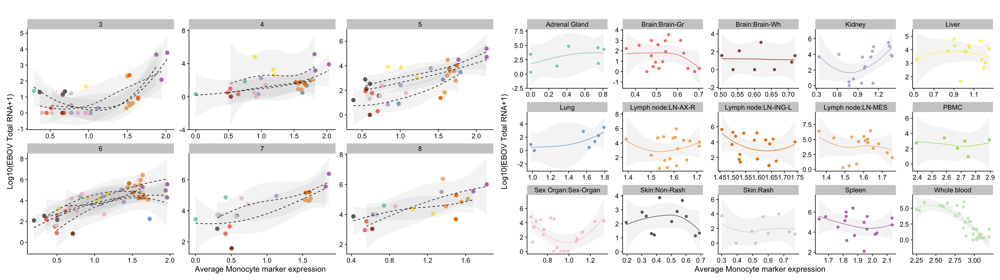

In [91]:
genes<-c("CD3D","HBA", "SELL", "PPBP","CD8A", "GNLY","CD4")                                
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp

genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes,]
rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
head(logVirCounts)
logVirCounts[colnames(logVirCounts[c(-3,-5)])] <- sapply(logVirCounts[colnames(logVirCounts[c(-3,-5)])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)



melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue","id.individual","viralReadCount"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"


melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(melt.logVirCounts$full.tissue))
##PLOT TREND



Filtered<-melt.logVirCounts.quant %>% group_by(full.tissue,dpi_time_factor,viralReadCount,id.individual) %>%
  summarise(mean=(mean(value,na.rm = TRUE)))%>% filter(!full.tissue %in% c("Whole blood","PBMC")) %>% filter(!dpi_time_factor %in% 
                                   c("0"))

(unique(Filtered$full.tissue))

options(repr.plot.width=12,repr.plot.height=7)


P1<-ggplot(Filtered %>% arrange(full.tissue),aes(y= log10(viralReadCount+1),x=mean,col=full.tissue,group=id.individual))+theme_cowplot()+
geom_point( size = 3)+geom_smooth(se = TRUE,scale="free_y",method = "loess",span=1,alpha=0.1)+
ggtitle("")+facet_wrap(~ id.individual,scales = "free")+
scale_color_manual(name="Tissue",values =color_ft[unique(Filtered$full.tissue)] ,guide="none")+
xlab("Average Monocyte marker expression")+
ylab("Log10(EBOV Total RNA+1)")

P2<-ggplot(Filtered %>% arrange(full.tissue),aes(y= log10(viralReadCount+1),
                                                 x=mean,col=full.tissue,group=id.individual  ))+theme_cowplot()+
geom_point( size = 3)+geom_smooth(se = TRUE,scale="free_y",
                                  method = "loess",span=2,alpha=0.1,size=0.5,color="black",linetype="dashed")+
ggtitle("")+facet_wrap(~ dpi_time_factor,scales = "free", ncol = 3)+
scale_color_manual(name="Tissue",values =color_ft[unique(Filtered$full.tissue)],guide="none" )+
xlab("Average Monocyte marker expression")+
ylab("Log10(EBOV Total RNA+1)")+theme_cowplot()

Filtered2<-melt.logVirCounts.quant %>% group_by(full.tissue,dpi_time_factor,viralReadCount,id.individual) %>%
  summarise(mean=(mean(value,na.rm = TRUE)))%>% filter(!full.tissue %in% c("Whole bloosd","PBdMC")) %>% filter(!dpi_time_factor %in% 
                                   c("0"))

P3<-ggplot(Filtered2 %>% arrange(full.tissue),aes(y= log10(viralReadCount+1),x=mean,col=full.tissue))+theme_cowplot()+
geom_point(size = 2)+geom_smooth(se = TRUE,scale="free_y",method = "loess",span=2,alpha=0.1,size=0.5)+
ggtitle("")+scale_color_manual(name="Tissue",values =color_ft[unique(Filtered2$full.tissue)],guide="none" )+
facet_wrap(~ full.tissue,scales = "free", ncol = 5)+xlab("Average Monocyte marker expression")+
ylab("Log10(EBOV Total RNA+1)")

options(repr.plot.width=25,repr.plot.height=7)

P2+P3

In [92]:
corn<-Filtered2 %>% group_by(full.tissue) %>%
  summarise(cor=(cor(log10(viralReadCount+1),mean)))
options(repr.plot.width=10,repr.plot.height=7)
PBMC<-ggplot(corn, aes(x=fct_reorder(full.tissue, desc(cor)),y=cor,fill=full.tissue)) +
    geom_bar(stat='identity') + scale_fill_manual(values = color_ft[unique(corn$full.tissue)],name="Tissue",guide="none")+
    theme_bw() + ylab("Correlation \n non-monocyte blood markers \n vs viral load")+
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))+ 
    scale_x_discrete("") +
 theme(text=element_text(size=20,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))


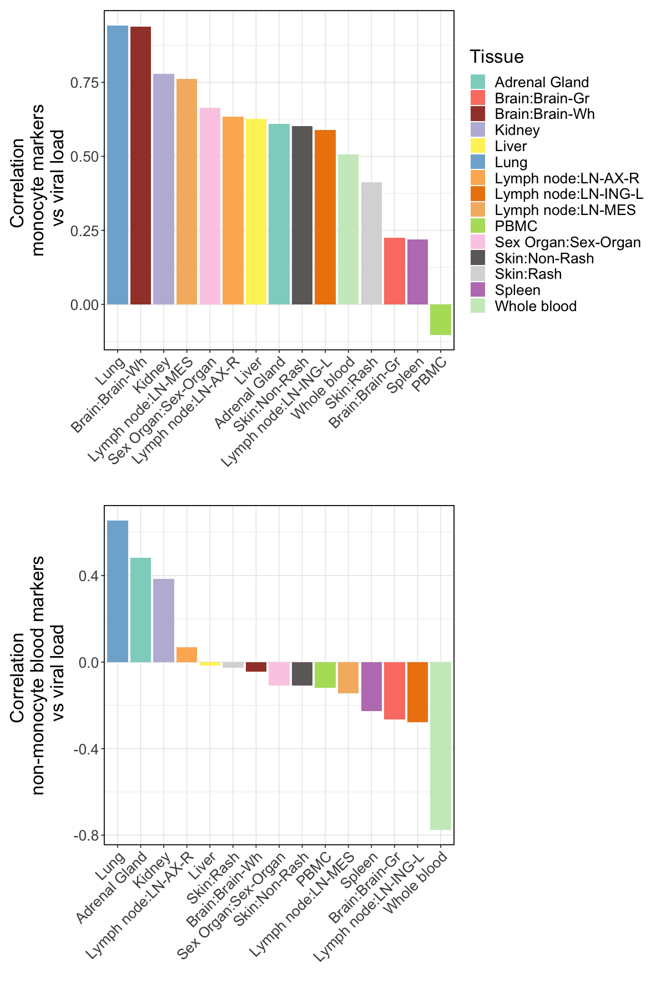

In [93]:
options(repr.plot.width=10,repr.plot.height=15)

Mono/PBMC

[1]   5 262

,quant.kulesh,dpi_time_factor,full.tissue,viralReadCount,id.individual,S100A9,CTSS,VCAN,CD14,FCN1
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
A0001_S121_L002,8.37e+04,6,Spleen,93139,RA1803,2.54904541438137,2.66700315915898,2.35993985829618,2.36237594227714,2.6189678224127
A0002_S124_L002,1.61e+02,6,Kidney,4341,RA1803,2.12320812023585,2.11269578526098,2.30679928079771,2.14842685262966,2.35809177538375
A0003,4.74e+03,6,Liver,19278,RA1803,2.38625094387245,2.20604975033913,2.57291209300244,3.06749120009154,3.01690382931127
A0006_S89_L002,4.60e+01,6,Brain:Brain-Gr,32,RA1803,0.867138856289334,1.76118516748088,1.92888055755666,1.33903439743889,1.18933876875317
A0007_S17_L001,1.34e+02,6,Sex Organ:Ovary,2413,RA1803,1.93167623327034,2.14287797428361,2.58703003143212,2.3462088158269,1.46945305026772
A0008_S140_L002,1.10e+04,6,Lymph node:LN-AX-R,12850,RA1803,2.25756086597579,2.74460412043399,1.67832718967398,2.02472629336874,1.63289697605641


`summarise()` has grouped output by 'full.tissue', 'dpi_time_factor',
'viralReadCount'. You can override using the `.groups` argument.


full.tissue,dpi_time_factor,viralReadCount,id.individual,mean
<chr>,<dbl>,<dbl>,<chr>,<dbl>
Adrenal Gland,0,0,RA1082,0.2372105
Adrenal Gland,0,0,RA1856,0.3415859
Adrenal Gland,0,94,RA1819,0.8876544
Adrenal Gland,3,23,RA1834,1.2061939
Adrenal Gland,4,1,RA0850,0.8587411
Adrenal Gland,4,68,RA1849,1.8147025


`geom_smooth()` using formula = 'y ~ x'


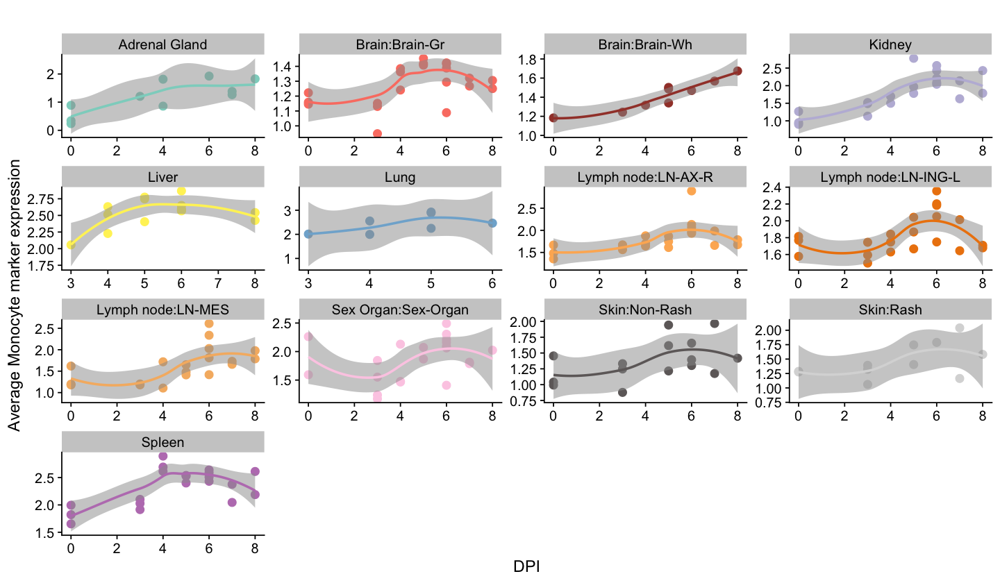

In [97]:
genes<-c("CTSS","VCAN","FCN1","CD14","S100A9")
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp
genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes,]
rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
head(logVirCounts)
logVirCounts[colnames(logVirCounts[c(-3,-5)])] <- sapply(logVirCounts[colnames(logVirCounts[c(-3,-5)])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)



melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue","id.individual","viralReadCount"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"


melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
melt.logVirCounts.quant["cluster"]<-clusters[melt.logVirCounts.quant$Tissue_Gene]
##PLOT TREND



Filtered<-melt.logVirCounts.quant %>% group_by(full.tissue,dpi_time_factor,viralReadCount,id.individual) %>%
  summarise(mean=(mean(value,na.rm = TRUE)))%>% filter(!full.tissue %in% 
                                   c("Whole blood")) %>% filter(!dpi_time_factor %in% 
                                   c("l"))

head(Filtered)

options(repr.plot.width=12,repr.plot.height=7)


ggplot(Filtered %>% arrange(full.tissue),aes(y= mean,x=dpi_time_factor,col=full.tissue,group=full.tissue))+theme_cowplot()+
geom_point( size = 3)+geom_smooth(se = TRUE,scale="free_y",method = "loess",span=1,alpha=0.5)+
ggtitle("")+facet_wrap(~ full.tissue,scales = "free")+
scale_color_manual(name="Tissue",values =color_ft[unique(Filtered$full.tissue)] ,guide="none")+
ylab("Average Monocyte marker expression")+
xlab("DPI")


[1]   1 262

[1]   3 262

`geom_smooth()` using formula = 'y ~ x'


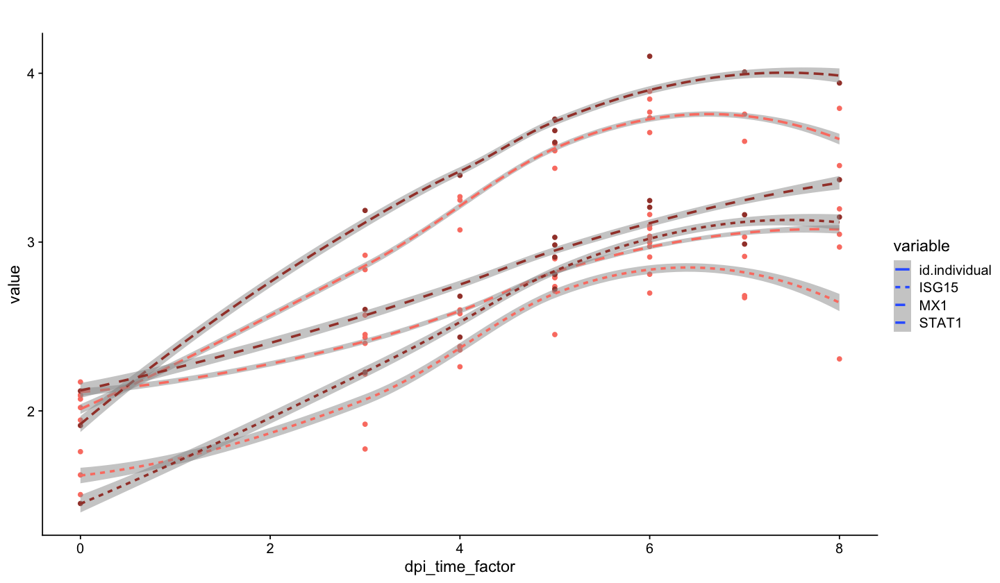

In [98]:
genes<-c("TIM-1", 'NPC1')
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp

genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes,]

rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
logVirCounts[colnames(logVirCounts[-3])] <- sapply(logVirCounts[colnames(logVirCounts[-3])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)
melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"


melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
##PLOT TREND
Filtered<-melt.logVirCounts.quant %>% filter(full.tissue %in% 
                                   c("Brain:Brain-Gr","Brain:Brain-Wh"))
BNB<-ggplot(Filtered %>% arrange(full.tissue),aes(x = dpi_time_factor,y=value,col=full.tissue,group=Tissue_Gene,
                                  linetype=variable))+theme_cowplot()+
geom_point()+geom_smooth(se = TRUE,scale="free_y",method = "loess",level=0.3,span=1,alpha=0.5)+
ggtitle("")+
        scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)],guide = "none" )


genes<-c("STAT1", 'ISG15', 'MX1')
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp

genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes,]

rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
dim(log_norm_counts)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
logVirCounts[colnames(logVirCounts[-3])] <- sapply(logVirCounts[colnames(logVirCounts[-3])],as.numeric)


logVirCounts$sample<-rownames(logVirCounts)
melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue"))


melt.logVirCounts$full.tissue[melt.logVirCounts$full.tissue %in%
                              c("Sex Organ:Ovary","Sex Organ:Sex-Organ","Sex Organ:Testis")]="Sex Organ:Sex-Organ"


melt.logVirCounts$Tissue_Gene<-paste0(melt.logVirCounts$full.tissue,"_",melt.logVirCounts$variable)
melt.logVirCounts.quant<-melt.logVirCounts%>%filter(!variable %in% c("viralReadCount","quant.kulesh","EBOV-MidReg","EBOV-3pTrailer"))%>%
filter(full.tissue %in% unique(data.quant$full.tissue))
melt.logVirCounts.quant["cluster"]<-clusters[melt.logVirCounts.quant$Tissue_Gene]
##PLOT TREND
Filtered<-melt.logVirCounts.quant %>% filter(full.tissue %in% 
                                   c("Brain:Brain-Gr","Brain:Brain-Wh"))
BNA<-ggplot(Filtered %>% arrange(full.tissue),aes(x = dpi_time_factor,y=value,col=full.tissue,group=Tissue_Gene,
                                  linetype=variable))+theme_cowplot()+
geom_point()+geom_smooth(se = TRUE,scale="free_y",method = "loess",level=0.3,span=1,alpha=0.5)+
ggtitle("")+
        scale_color_manual(name="Tissue",values =color_ft[unique(dataCluster$full.tissue)],guide = "none" )
BNA

In [99]:
options(repr.plot.width=6,repr.plot.height=15)

BNA/BNB/LNA/LNB
#ggsave("../Line.pdf",width=6,height=15)


ERROR: Error in eval(expr, envir, enclos): object 'LNA' not found


In [100]:
extraecllular.genes<-readRDS("../extraecllular.genes.rds")

logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))

head(melt.logVirCounts)


,sample,dpi_time_factor,full.tissue,variable,value,Tissue_Gene
,<chr>,<dbl>,<chr>,<fct>,<dbl>,<chr>
1,A0001_S121_L002,6,Spleen,quant.kulesh,83700,Spleen_quant.kulesh
2,A0002_S124_L002,6,Kidney,quant.kulesh,161,Kidney_quant.kulesh
3,A0003,6,Liver,quant.kulesh,4740,Liver_quant.kulesh
4,A0006_S89_L002,6,Brain:Brain-Gr,quant.kulesh,46,Brain:Brain-Gr_quant.kulesh
5,A0007_S17_L001,6,Sex Organ:Sex-Organ,quant.kulesh,134,Sex Organ:Sex-Organ_quant.kulesh
6,A0008_S140_L002,6,Lymph node:LN-AX-R,quant.kulesh,11000,Lymph node:LN-AX-R_quant.kulesh


`summarise()` has grouped output by 'full.tissue'. You can override using the
`.groups` argument.


full.tissue,dpi_time_factor,mean,sd
<chr>,<dbl>,<dbl>,<dbl>
Adrenal Gland,0,0.8698509,1.0723497
Adrenal Gland,3,1.2987032,1.0926462
Adrenal Gland,4,1.1356003,1.0776026
Adrenal Gland,6,1.2721783,0.9443327
Adrenal Gland,7,1.0404962,1.0373754
Adrenal Gland,8,1.4235688,0.9917522


full.tissue,0,3,5,6,7,8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Brain:Brain-Gr,1.604492,1.479938,1.512401,1.464818,1.405549,1.422576
Brain:Brain-Wh,1.471004,1.516533,1.431292,1.472773,1.380417,1.416548
Kidney,1.394749,1.485539,1.366808,1.407981,1.325726,1.438701
Lymph node:LN-AX-R,1.460985,1.385427,1.401468,1.384304,1.336138,1.270921
Lymph node:LN-ING-L,1.563527,1.460208,1.463582,1.318606,1.366800,1.279492
Lymph node:LN-MES,1.355249,1.277753,1.335153,1.291472,1.264656,1.309951


Using full.tissue as id variables



,full.tissue,variable,value
,<chr>,<fct>,<dbl>
1,Brain:Brain-Gr,0,1.604492
2,Brain:Brain-Wh,0,1.471004
3,Kidney,0,1.394749
4,Lymph node:LN-AX-R,0,1.460985
5,Lymph node:LN-ING-L,0,1.563527
6,Lymph node:LN-MES,0,1.355249


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


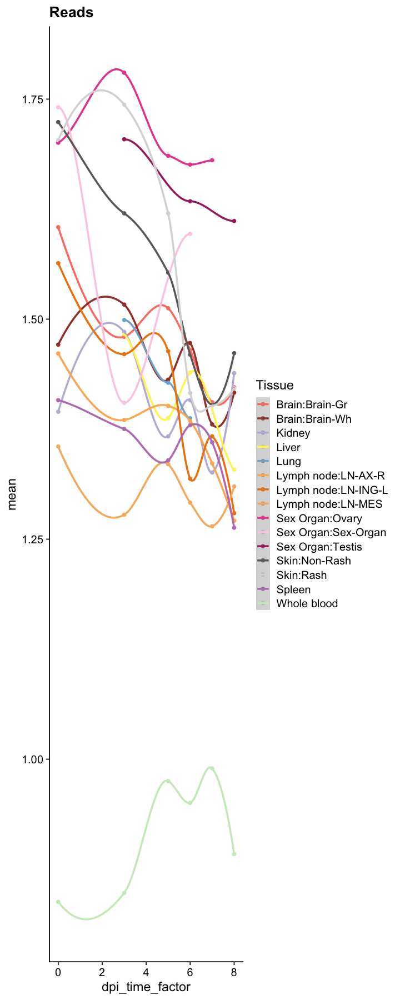

In [101]:
genes<-extraecllular.genes
dd<-se.qc.experimental
#se.qc.experimental<-dds.qc.experimental.alltp

#genes<-rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% genes]
#ISGs<-se.qc.experimental[select,][rowData(se.qc.experimental[select,])$external_gene_name %in% isg.set.for.scoring.fromSC,]
ISGs<-se.qc.experimental[genes[!is.na(genes)],]
rownames(ISGs)<-rowData(ISGs)$external_gene_name
#rownames(ISGs)[(length(topCor)-2):length(topCor)]<-topCor[(length(topCor)-2):length(topCor)]

norm_counts <- counts(ISGs, normalized=TRUE)
log_norm_counts <- log10(norm_counts+1)
#scale_norm_markers <- scale(norm_counts[viralGenes,],center = T,scale=T,)
logVirCounts<-as.data.frame(t(rbind(test,log_norm_counts)))
logVirCounts[c(-3,-5)] <- sapply(logVirCounts[c(-3,-5)] ,as.numeric)


logVirCounts$sample<-rownames(logVirCounts)
logVirCounts$quant.kulesh<-NULL
melt.logVirCounts<-reshape2::melt(logVirCounts,id.vars = c("sample","dpi_time_factor","full.tissue","id.individual","viralReadCount"))

mean.log.virus<-melt.logVirCounts %>%
  group_by(full.tissue, dpi_time_factor) %>%
  summarise(mean=(mean(value,na.rm = TRUE)),sd=(sd(value,na.rm = TRUE)))

head(mean.log.virus)
dataCluster2<-mean.log.virus %>% filter(!full.tissue %in% c("PBMC","Adrenal Gland"))%>% filter(!dpi_time_factor %in% c(4,1,2))  
#dataCluster%>%filter(variable %in% c("quant.kulesh"))
data_wide2 <- dataCluster2 %>% dplyr::arrange(dpi_time_factor) %>% 
  tidyr::pivot_wider(id_cols = full.tissue, names_from = dpi_time_factor, values_from = mean)
head(data_wide2)

data.quant<-melt(data_wide2)
data.quant<-data.quant 
head(data.quant)
####PLOT MEAN                
ggplot(dataCluster2,aes(x = dpi_time_factor,y=mean,col=full.tissue))+theme_cowplot()+
geom_point()+geom_smooth(aes(group=full.tissue))+
scale_color_manual(name="Tissue",values =color_ft[unique(data.quant$full.tissue)])+
ggtitle("Reads")



